# Exercice 1: Learning a WGAN for synthetic 2-dimensional datasets

<br/><br/><br/><br/>

This practical session contains
- "QUESTION" fields in the text, that you should answer
- blocks of code that you should complete at every region marked with ### ... ###

We advise you to open the notebook on Google Colab.

### Imports

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import time

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

if torch.cuda.is_available():
    device = torch.device('cuda')
    dtype = torch.cuda.FloatTensor
else:
    device = torch.device('cpu')
    dtype = torch.FloatTensor

# If you don't want to bother with the device, stay on cpu:
# device = torch.device('cpu')

print(device)

cuda


### Target Measure

In the following cell, we define the discrete target measure $\nu$ that will serve as dataset for this practical session.

The variable `xgrid` contains a grid of points that will be useful below to display the discriminators along training.

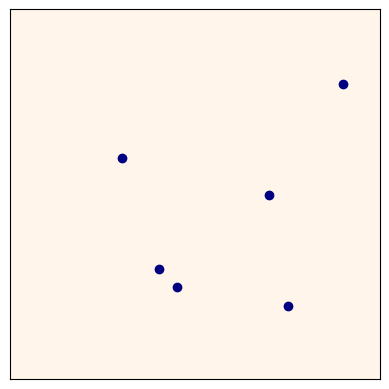

In [3]:
d = 2   # dimension of the data points

# First dataset with 6 points
n = 6
y = torch.zeros((n,d), device=device)
y[0, 0] = 0.9
y[0, 1] = 0.2
y[1, 0] = 0.75
y[1, 1] = 0.8
y[2, 0] = 0.3
y[2, 1] = 0.4
y[3, 0] = 0.4
y[3, 1] = 0.7
y[4, 0] = 0.45
y[4, 1] = 0.75
y[5, 0] = 0.7
y[5, 1] = 0.5

# # Second dataset with 100 points
# n = 100
# t = torch.pi*torch.linspace(-.2,1.2,n)
# y = .05*torch.randn((n,d))
# y[:,0] += torch.cos(t)
# y[:,1] += torch.sin(2*t)
# y = .5 + .3*y
# y = y.to(device)

# Define masses (empirical measure on the data points)
nu = torch.ones(n, device=device)/n

# generate grid for plotting purpose
nr,nc = 256,256
extent = ((-0.5/nc, 1-0.5/nc, 1-0.5/nr, -0.5/nr))
xs = torch.linspace(0, 1, steps=nr)
ys = torch.linspace(0, 1, steps=nc)
xm, ym = torch.meshgrid(xs, ys, indexing='ij')
xm = xm.T
ym = ym.T
xgrid = torch.cat((xm.reshape(nr*nc,1),ym.reshape(nr*nc,1)),1).to(device)

# Plot data points
fig = plt.figure(dpi=100)
plt.xticks([])
plt.yticks([])
plt.imshow(np.zeros((nr,nc)),cmap = 'Oranges', extent=extent) # background
plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
plt.show()

## Define Generator architecture

QUESTION: Examine the layers and parameters of the following generative network.

Write a short description of the architecture of this network.

The Generator network is a multi-layer perceptron (MLP) with:

- A configurable number of hidden layers (nlayers), each with n_hid hidden units and ELU activation.
- A linear transformation followed by a sigmoid activation in the output layer.
- Xavier initialization for the weights to facilitate better convergence during training.

In [4]:
class Generator(torch.nn.Module):

    def __init__(self, n_in, n_out, n_hid=10, nlayers=3, device=torch.device("cpu")):
        super(Generator, self).__init__()

        self.n_in = n_in
        self.n_out = n_out
        self.n_hid = n_hid
        self.nlayers = nlayers
        self.hidden = nn.ModuleList()

        for n in range(nlayers):
            n_in_t = n_in if n==0 else n_hid
            self.hidden.append(nn.Sequential(
            nn.Linear(n_in_t, n_hid),
            nn.ELU(1)
        ).to(device))

        self.out = nn.Sequential(
            nn.Linear(n_hid, n_out),
            nn.Sigmoid()
        ).to(device)

        self.apply(self._init_weights)


    def forward(self, x):
        for n in range(self.nlayers):
            x = self.hidden[n](x)
        x = self.out(x)
        return x


    def _init_weights(self, module):
        if isinstance(module, nn.Linear):
            torch.nn.init.xavier_uniform_(module.weight, 1.0)
            if module.bias is not None:
                module.bias.data.zero_()


QUESTION: Plot one initial configuration of the generator (draw a batch of generated points)

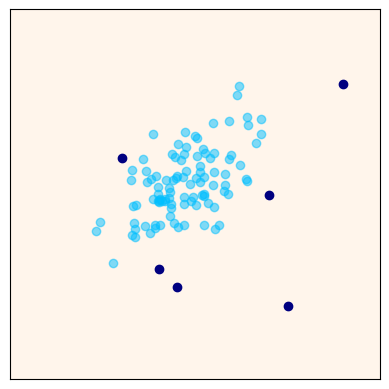

In [5]:
torch.manual_seed(0)  # initialize random seed for reproducibility

n_in = 10    # dimension of the input noise
b = 100      # batch size

# Initialize generator
G = Generator(n_in=n_in, n_out=d, n_hid=100, nlayers=3, device=device)

# Draw a batch x of generated points
#    Input noise z : standard normal with shape (b, n_in)

z = torch.randn((b, n_in), device=device)
x = G(z)


# Plot
xd = x.detach()
fig = plt.figure(dpi=100)
plt.xticks([])
plt.yticks([])
plt.imshow(np.zeros((nr,nc)),cmap = 'Oranges', extent=extent) # background
plt.scatter(xd[:, 0].cpu(), xd[:,1].cpu(),c='deepskyblue',alpha=.5)
plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
plt.show()

## Define Discriminator Architecture

In [6]:
class Discriminator(nn.Module):
  def __init__(self, n_in, n_hid=10):
    super(Discriminator, self).__init__()

    self.n_hid = n_hid
    self.n_in = n_in

    self.fc1 = nn.Linear(n_in, n_hid)
    self.fc2 = nn.Linear(n_hid, n_hid)
    self.fc3 = nn.Linear(n_hid, 1)

  def forward(self, x):
    y = nn.LeakyReLU(negative_slope=0.2)(self.fc1(x))
    y = nn.LeakyReLU(negative_slope=0.2)(self.fc2(y))
    y = self.fc3(y)
    return y

## Discriminator training with Weight clipping

QUESTION: For a fixed generator, train the discriminator with WGAN loss and weight clipping.

Try changing the clip_value. What do you observe?

**Answer :**

- Small clip_value (e.g., 0.01): The discriminator weights are more tightly constrained, leading to underfitting. The discriminator might not differentiate well between real and fake data.
- Moderate clip_value (e.g., 0.1): A balance where the discriminator has enough capacity to learn meaningful differences between real and fake data without overfitting or instability.
- Large clip_value (e.g., 0.5): The discriminator weights have more freedom, which can lead to overfitting. The training might become unstable, and the discriminator could dominate the generator, making it harder for the generator to learn

[0/1000], 0.010855


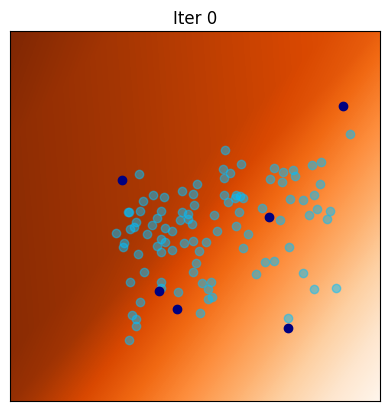

[100/1000], -0.001058


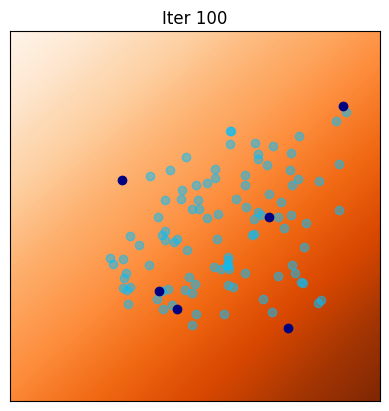

[200/1000], -0.002462


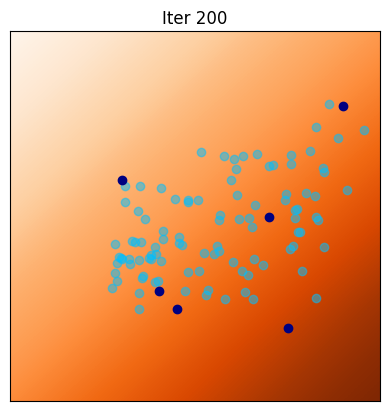

[300/1000], -0.003468


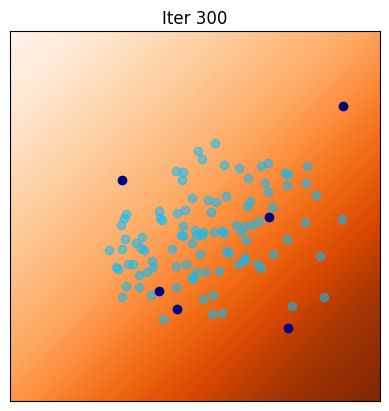

[400/1000], -0.004206


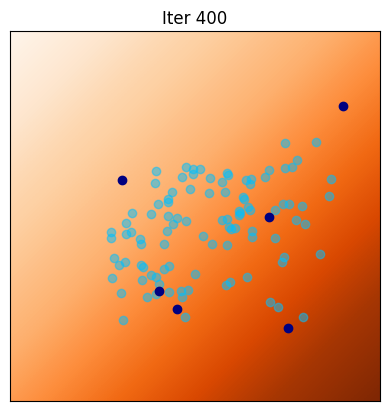

[500/1000], -0.002640


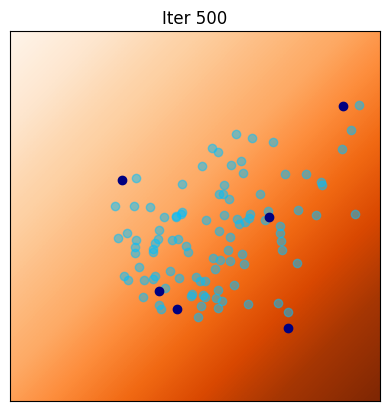

[600/1000], -0.004126


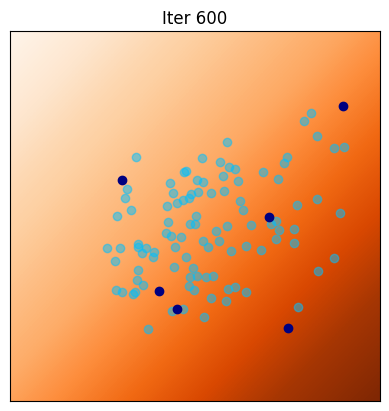

[700/1000], -0.003504


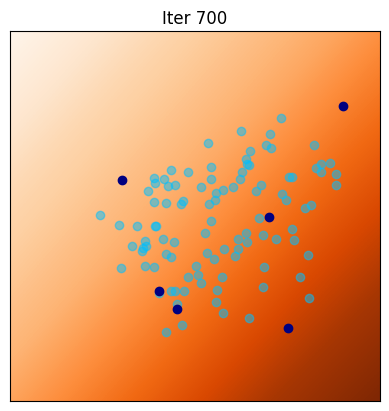

[800/1000], -0.004521


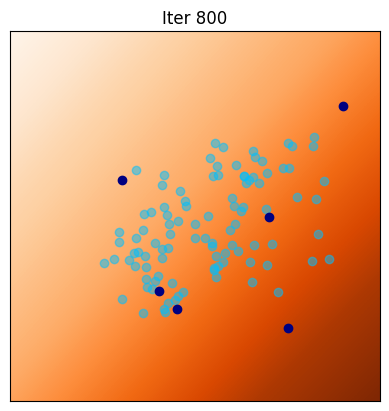

[900/1000], -0.003996


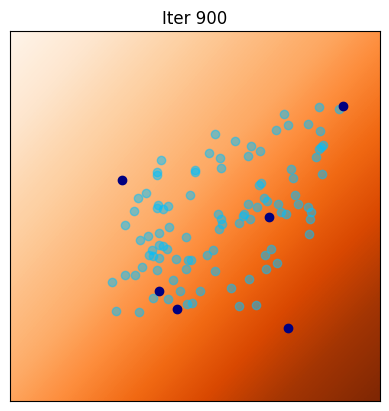

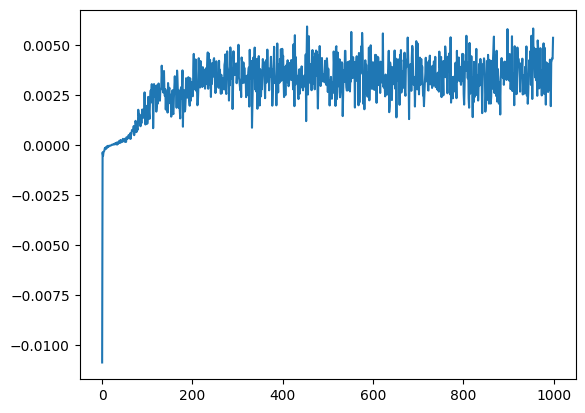

In [7]:
torch.manual_seed(1)  # initialize random seed for reproducibility

# fix one generator
G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)

# parameters for discriminator optimization
lrdisc = 0.002
beta_1 = 0.5
beta_2 = 0.999
niterD=1000

clip_value = .1

D = Discriminator(n_in=d, n_hid=10).to(device)
optimD = optim.Adam(D.parameters(), lr=lrdisc, betas=(beta_1, beta_2))

iter_display = 100  # display current configuration each iter_display iteration

# Lists to keep track of progress
Dlosses = []

for iter in range(0,niterD):

    ### UPDATE OF D ###
    optimD.zero_grad()

    z = torch.randn((b, n_in), device=device)
    x = G(z)

    Dloss =   - torch.mean(D(y)) +  torch.mean(D(x.detach()))

    Dloss.backward()

    optimD.step()

    ### ... Weight Clipping ... ###
    for p in D.parameters():
        p.data.clamp_(-clip_value, clip_value)

    ### SAVE LOSS ###
    Dlosst = Dloss.item()
    Dlosses.append(-Dlosst)

    if(iter%iter_display == 0):
        print('[%d/%d], %f' % (iter, niterD, Dlosst))
        Dxgrid = D(xgrid).detach().cpu().numpy().reshape(nr,nc)
        x = G(z)
        xd = x.detach().squeeze(1)
        strtitle = 'Iter '+str(iter)
        fig = plt.figure(dpi=100)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(Dxgrid,cmap = 'Oranges', extent=extent)  # discriminator
        plt.scatter(xd[:, 0].cpu(), xd[:,1].cpu(),c='deepskyblue',alpha=.5)
        plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
        plt.title(strtitle)
        plt.show()

plt.plot(Dlosses)

## Estimate the Lipschitz constant of the discriminator

The following function computes a lower bound of the Lipschitz constant of $D$ on points that are interpolated between $x$ and $y$.

NB: If $x$ and $y$ do not have the same number of points, we discard the last points.
In comment, we give an alternative code that allows to compute all segments $[x_i, y_j]$ (but it is, of course, slower that just computing segments $[x_i, y_i]$).

In [8]:
def lipconstant(D,x,y):
    b = x.shape[0]
    n = y.shape[0]
    # shrink vectors if they are too large
    if n>b:
        y = y[0:b,:]
        n = b
    else:
        x = x[0:n,:]
        b = n
    # compute interpolated points
    alpha = torch.rand((b,1),device=device)
    interp = alpha * y + (1 - alpha) * x
    interp.requires_grad_()

    # Calculate probability of interpolated examples
    Di = D(interp).view(-1)

    # Calculate gradients of probabilities with respect to examples
    gradout = torch.ones(Di.size()).to(device)
    gradients = torch.autograd.grad(outputs=Di, inputs=interp, grad_outputs=gradout,
       create_graph=True, retain_graph=True)[0]

    # Derivatives of the gradient close to 0 can cause problems because of
    # the square root, so manually calculate norm and add epsilon
    gradients_norm = torch.sqrt(torch.sum(gradients ** 2, dim=1))

    # Return gradient penalty
    return torch.mean(gradients_norm)

#     # Calculate interpolation
#     b = x.shape[0]
#     n = y.shape[0]
#     alpha = torch.rand((b,n,1),device=device)
#     interp = (alpha * y[None,:,:] + (1 - alpha) * x[:,None,:]).flatten(end_dim=1)
#     interp.requires_grad_()


QUESTION: Use this function to examine the Lipschitz constant of the final discriminator obtained above with weight clipping.


In [9]:
lipschitz_constant = lipconstant(D, x, y)
print('Estimated Lipschitz constant:', lipschitz_constant.item())

Estimated Lipschitz constant: 0.06293635070323944


## Gradient Penalty

QUESTION: Implement a function computing the gradient penalty of a discriminator $D$ on points $X$ that are randomly interpolated between $x$ and $y$:
$$ GP(D) = \mathbb{E}\left[ \Big(\|\nabla D(X)\| - 1 \Big)^2 \right] .$$
In pratice you will use
$$\|\nabla D(X)\| \approx \sqrt{\|\nabla D (X)\|_2^2 + 10^{-12} } $$
to avoid numerical instability.

In [10]:
def gradient_penalty(D,x,y):
    b = x.shape[0]
    n = y.shape[0]
    # shrink vectors if they are too large
    if n>b:
        y = y[0:b,:]
        n = b
    else:
        x = x[0:n,:]
        b = n
    # compute interpolated points
    alpha = torch.rand((b,1),device=device)
    interp = (alpha * y + (1 - alpha) * x)
    interp.requires_grad_()

#     # Calculate interpolation
#     b = x.shape[0]
#     n = y.shape[0]
#     alpha = torch.rand((b,n,1),device=device)
#     interp = (alpha * y[None,:,:] + (1 - alpha) * x[:,None,:]).flatten(end_dim=1)
#     interp.requires_grad_()

    # Calculate probability of interpolated examples
    Di = D(interp).view(-1)

    # Calculate gradients of probabilities with respect to examples
    gradout = torch.ones(Di.size()).to(device)
    gradients = torch.autograd.grad(outputs=Di, inputs=interp, grad_outputs=gradout,
       create_graph=True, retain_graph=True)[0]

    # Derivatives of the gradient close to 0 can cause problems because of
    # the square root, so manually calculate norm and add epsilon
    gradients_norm = torch.sqrt(torch.sum(gradients ** 2, dim=1) + 1e-12)

    # Return gradient penalty
    return ((gradients_norm - 1) ** 2).mean()
#     return ((gradients_norm - 1) ** 2*(gradients_norm>1)).mean()

print(gradient_penalty(D,x,y))

tensor(0.8764, device='cuda:0', grad_fn=<MeanBackward0>)


## Discriminator training with Gradient Penalty

QUESTION: Complete the following code at the blocks ###...###.

Adjust the weight of the gradient penalty (parameter `gpw`) to get a Lipschitz constant $\approx 1$.

[0/1000], Dloss=5.6300, Lip(D)=0.2618


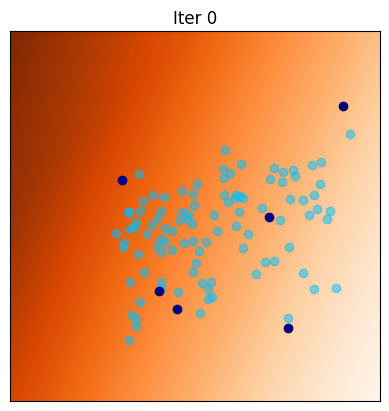

[100/1000], Dloss=0.0547, Lip(D)=1.0022


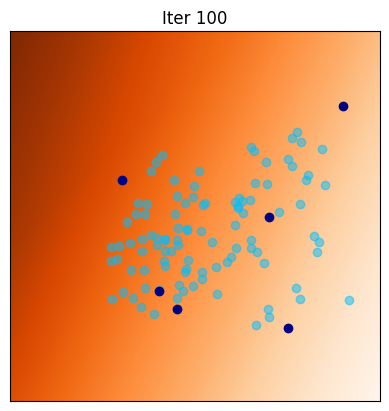

[200/1000], Dloss=0.0414, Lip(D)=0.9984


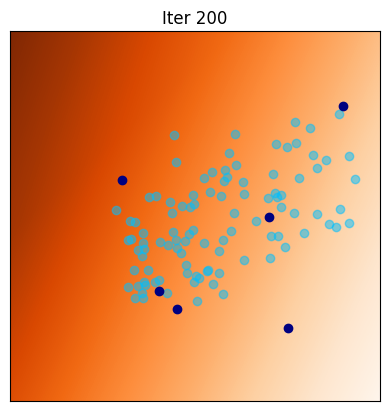

[300/1000], Dloss=0.0556, Lip(D)=0.9985


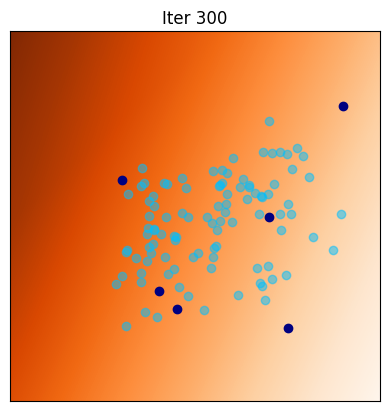

[400/1000], Dloss=0.0208, Lip(D)=0.9944


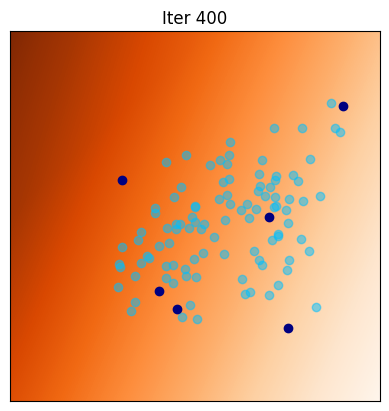

[500/1000], Dloss=0.0542, Lip(D)=0.9959


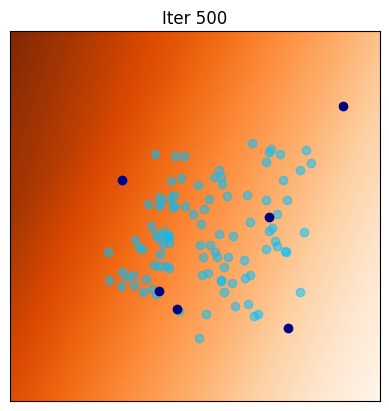

[600/1000], Dloss=0.0403, Lip(D)=0.9982


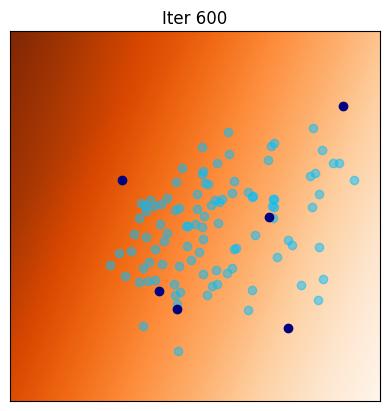

[700/1000], Dloss=0.0345, Lip(D)=1.0013


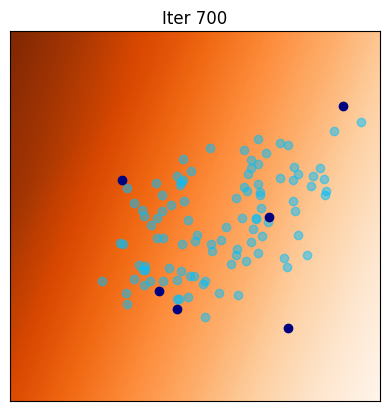

[800/1000], Dloss=0.0364, Lip(D)=0.9958


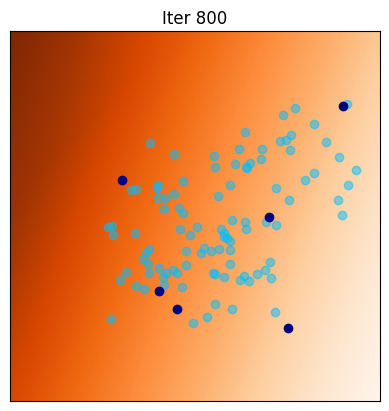

[900/1000], Dloss=0.0521, Lip(D)=0.9951


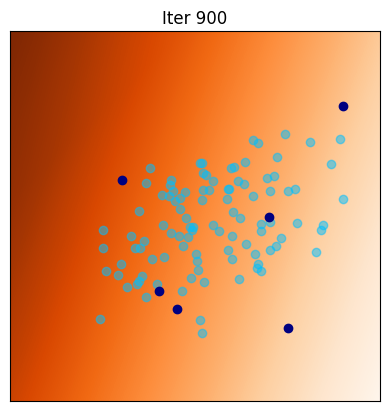

Final estimated Lipschitz constant =  0.9993077516555786


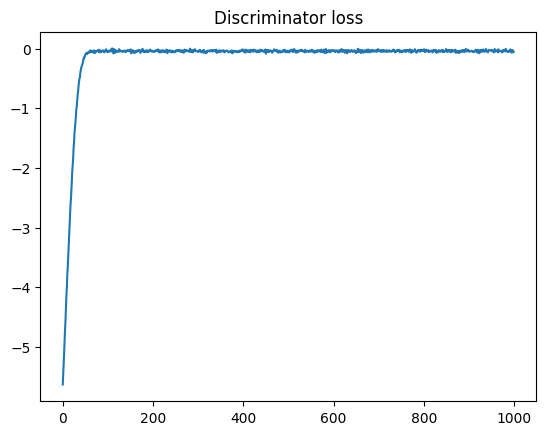

In [11]:
torch.manual_seed(1)  # initialize random seed for reproducibility

# Initialize generators and discriminators
G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
D = Discriminator(n_in=d, n_hid=10).to(device)

# parameters for training
lrdisc = 0.002
beta_1 = 0.5
beta_2 = 0.999
niterD=1000
gpw = 10    # parameter for gradient penalty

optimD = optim.Adam(D.parameters(), lr=lrdisc, betas=(beta_1, beta_2))


iter_display = 100  # display current configuration each iter_display iteration

# Lists to keep track of progress
Dlosses = []

for iter in range(0,niterD):

    ### UPDATE OF D ###
    optimD.zero_grad()

    z = torch.randn((b, n_in), device=device)
    x = G(z)
    gp = gradient_penalty(D, x.detach(), y)
    Dloss =  -torch.mean(D(y)) + torch.mean(D(x.detach())) + gpw * gp

    Dloss.backward()
    optimD.step()

    ### SAVE LOSS ###
    Dlosst = Dloss.item()
    Dlosses.append(-Dlosst)

    current_lipschitz = lipconstant(D, x,y).item()

    if(iter%iter_display == 0):
        print('[%d/%d], Dloss=%.4f, Lip(D)=%.4f' % (iter, niterD, Dlosst,lipconstant(D,x,y).item()))
        Dxgrid = D(xgrid).detach().cpu().numpy().reshape(nr,nc)
        x = G(z)
        xd = x.detach().squeeze(1)
        strtitle = 'Iter '+str(iter)
        fig = plt.figure(dpi=100)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(Dxgrid,cmap = 'Oranges', extent=extent)  # discriminator
        plt.scatter(xd[:, 0].cpu(), xd[:,1].cpu(),c='deepskyblue',alpha=.5)
        plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
        plt.title(strtitle)
        plt.show()

print('Final estimated Lipschitz constant = ',lipconstant(D,x,y).item())

plt.figure(dpi=100)
plt.plot(Dlosses)
plt.title('Discriminator loss')
plt.show()

## WGAN-GP training

QUESTION: Complete the following code in order to train simultaneously the generator and discriminator.

You will alternate `niterD` iterations on the discriminator and `niterG` iterations of the discriminator.

[1/100] 	Loss_D: -0.1572	Loss_G: 0.0499	Lip(D)=1.4870
[2/100] 	Loss_D: -0.0999	Loss_G: 0.2775	Lip(D)=1.3901
[3/100] 	Loss_D: -0.1282	Loss_G: 0.1535	Lip(D)=1.4800
[4/100] 	Loss_D: -0.1324	Loss_G: 0.0706	Lip(D)=1.3842
[5/100] 	Loss_D: -0.1475	Loss_G: -0.3421	Lip(D)=1.4030


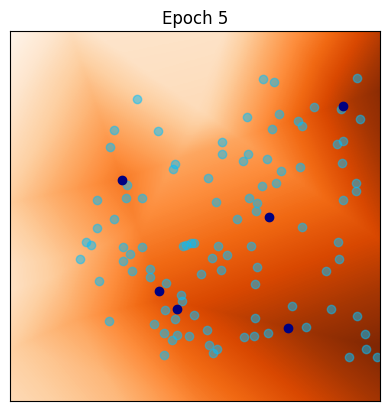

[6/100] 	Loss_D: -0.0970	Loss_G: 0.2609	Lip(D)=1.2597
[7/100] 	Loss_D: -0.1139	Loss_G: 0.4237	Lip(D)=1.0900
[8/100] 	Loss_D: -0.1319	Loss_G: 0.2122	Lip(D)=1.1224
[9/100] 	Loss_D: -0.1027	Loss_G: 0.3207	Lip(D)=1.3790
[10/100] 	Loss_D: -0.0853	Loss_G: 0.8214	Lip(D)=1.2352


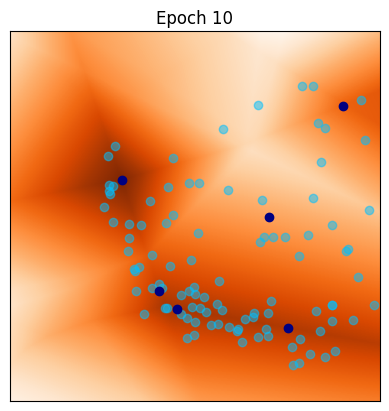

[11/100] 	Loss_D: -0.0566	Loss_G: 0.7910	Lip(D)=1.3909
[12/100] 	Loss_D: -0.0702	Loss_G: 0.1677	Lip(D)=1.2008
[13/100] 	Loss_D: -0.1233	Loss_G: -0.5352	Lip(D)=1.4380
[14/100] 	Loss_D: -0.0842	Loss_G: -0.3738	Lip(D)=1.4892
[15/100] 	Loss_D: -0.0771	Loss_G: 0.4898	Lip(D)=1.2949


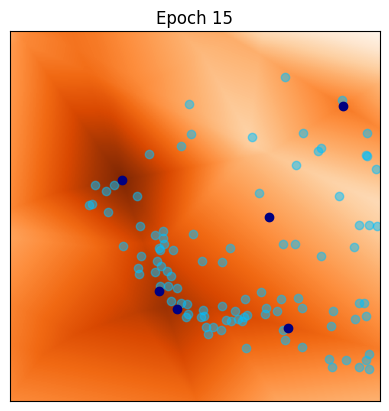

[16/100] 	Loss_D: -0.0935	Loss_G: -0.2608	Lip(D)=1.1628
[17/100] 	Loss_D: -0.0475	Loss_G: -1.0933	Lip(D)=1.2538
[18/100] 	Loss_D: -0.0624	Loss_G: -1.6999	Lip(D)=1.8198
[19/100] 	Loss_D: -0.1179	Loss_G: -1.9621	Lip(D)=1.3019
[20/100] 	Loss_D: -0.0872	Loss_G: -1.9690	Lip(D)=1.3424


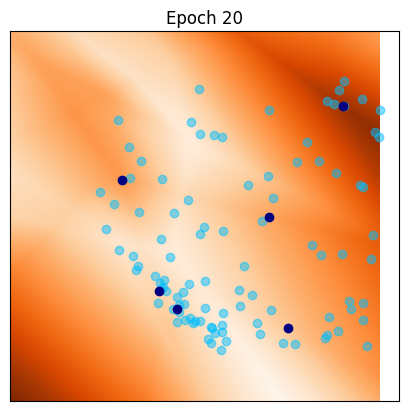

[21/100] 	Loss_D: -0.0480	Loss_G: -2.1073	Lip(D)=1.2768
[22/100] 	Loss_D: -0.0618	Loss_G: -2.8855	Lip(D)=1.3300
[23/100] 	Loss_D: -0.0431	Loss_G: -2.6650	Lip(D)=1.1909
[24/100] 	Loss_D: -0.0930	Loss_G: -3.1603	Lip(D)=1.2436
[25/100] 	Loss_D: -0.0974	Loss_G: -3.9550	Lip(D)=1.3693


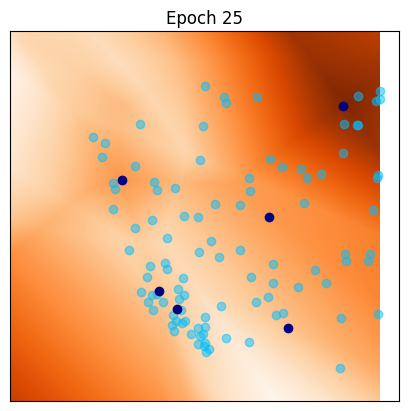

[26/100] 	Loss_D: -0.0643	Loss_G: -4.8422	Lip(D)=1.3787
[27/100] 	Loss_D: -0.0931	Loss_G: -5.4750	Lip(D)=1.2953
[28/100] 	Loss_D: -0.1089	Loss_G: -6.3113	Lip(D)=1.3208
[29/100] 	Loss_D: -0.1304	Loss_G: -6.2193	Lip(D)=1.1781
[30/100] 	Loss_D: -0.1081	Loss_G: -7.3807	Lip(D)=1.2756


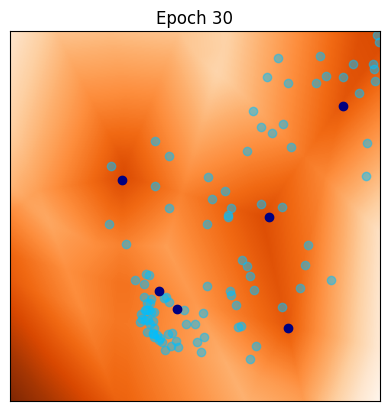

[31/100] 	Loss_D: -0.1603	Loss_G: -9.5525	Lip(D)=1.5612
[32/100] 	Loss_D: -0.1102	Loss_G: -9.6562	Lip(D)=1.4287
[33/100] 	Loss_D: -0.1305	Loss_G: -10.3362	Lip(D)=1.3632
[34/100] 	Loss_D: -0.1322	Loss_G: -11.4471	Lip(D)=1.3692
[35/100] 	Loss_D: -0.1186	Loss_G: -11.8261	Lip(D)=1.4089


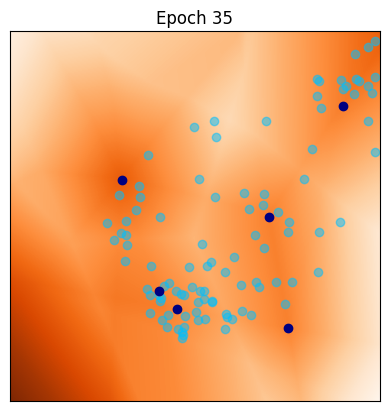

[36/100] 	Loss_D: -0.1227	Loss_G: -12.8711	Lip(D)=1.2509
[37/100] 	Loss_D: -0.1035	Loss_G: -12.9498	Lip(D)=1.5285
[38/100] 	Loss_D: -0.0959	Loss_G: -13.4243	Lip(D)=1.2784
[39/100] 	Loss_D: -0.1292	Loss_G: -13.4605	Lip(D)=1.6573
[40/100] 	Loss_D: -0.0687	Loss_G: -13.1736	Lip(D)=1.4208


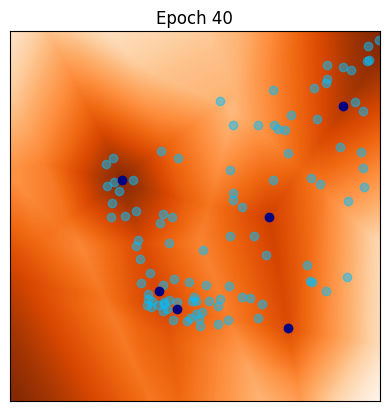

[41/100] 	Loss_D: -0.1006	Loss_G: -13.7779	Lip(D)=1.2923
[42/100] 	Loss_D: -0.0825	Loss_G: -14.4116	Lip(D)=1.5351
[43/100] 	Loss_D: -0.1089	Loss_G: -16.3097	Lip(D)=1.1598
[44/100] 	Loss_D: -0.1302	Loss_G: -14.9879	Lip(D)=1.5325
[45/100] 	Loss_D: -0.0808	Loss_G: -15.2275	Lip(D)=1.4050


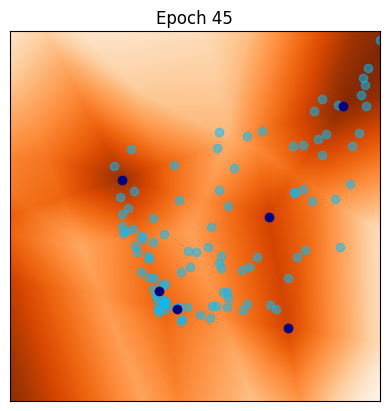

[46/100] 	Loss_D: -0.0601	Loss_G: -16.2406	Lip(D)=1.3358
[47/100] 	Loss_D: -0.1096	Loss_G: -17.1710	Lip(D)=1.3739
[48/100] 	Loss_D: -0.0659	Loss_G: -18.3415	Lip(D)=1.2841
[49/100] 	Loss_D: -0.1230	Loss_G: -17.1532	Lip(D)=1.5182
[50/100] 	Loss_D: -0.0598	Loss_G: -17.5959	Lip(D)=1.7664


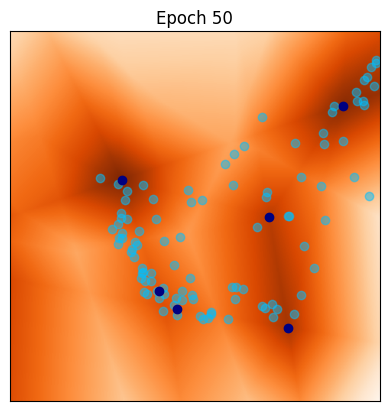

[51/100] 	Loss_D: -0.1113	Loss_G: -17.9407	Lip(D)=1.4101
[52/100] 	Loss_D: -0.0867	Loss_G: -18.1905	Lip(D)=1.3238
[53/100] 	Loss_D: -0.0844	Loss_G: -17.2322	Lip(D)=1.5169
[54/100] 	Loss_D: -0.0881	Loss_G: -15.9485	Lip(D)=1.3967
[55/100] 	Loss_D: -0.0741	Loss_G: -16.1457	Lip(D)=1.4973


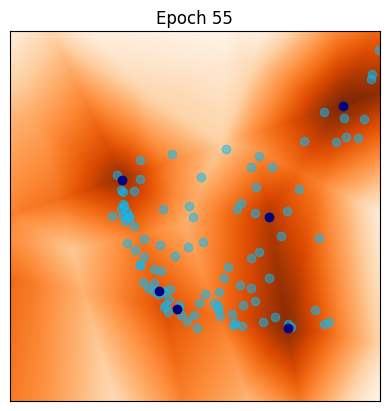

[56/100] 	Loss_D: -0.0585	Loss_G: -16.3090	Lip(D)=1.1766
[57/100] 	Loss_D: -0.0923	Loss_G: -16.5261	Lip(D)=1.4567
[58/100] 	Loss_D: -0.0771	Loss_G: -16.2882	Lip(D)=1.2951
[59/100] 	Loss_D: -0.0899	Loss_G: -15.3521	Lip(D)=1.1698
[60/100] 	Loss_D: -0.0980	Loss_G: -15.6829	Lip(D)=1.1869


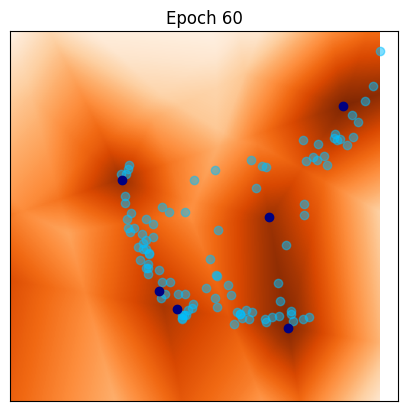

[61/100] 	Loss_D: -0.0810	Loss_G: -15.4894	Lip(D)=1.2199
[62/100] 	Loss_D: -0.0976	Loss_G: -15.9763	Lip(D)=1.4265
[63/100] 	Loss_D: -0.0851	Loss_G: -15.7443	Lip(D)=1.2164
[64/100] 	Loss_D: -0.0884	Loss_G: -16.0152	Lip(D)=1.2905
[65/100] 	Loss_D: -0.0831	Loss_G: -15.3340	Lip(D)=1.2683


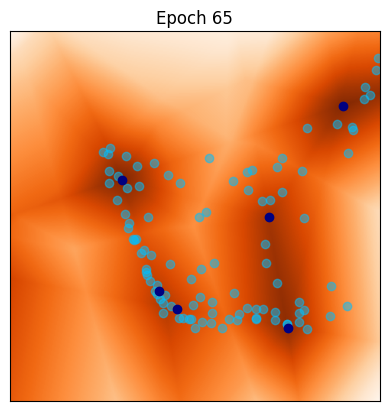

[66/100] 	Loss_D: -0.0695	Loss_G: -14.8164	Lip(D)=1.4698
[67/100] 	Loss_D: -0.0781	Loss_G: -14.2746	Lip(D)=1.2164
[68/100] 	Loss_D: -0.0785	Loss_G: -15.1521	Lip(D)=1.2492
[69/100] 	Loss_D: -0.1037	Loss_G: -15.2846	Lip(D)=1.3219
[70/100] 	Loss_D: -0.0815	Loss_G: -17.0209	Lip(D)=1.2865


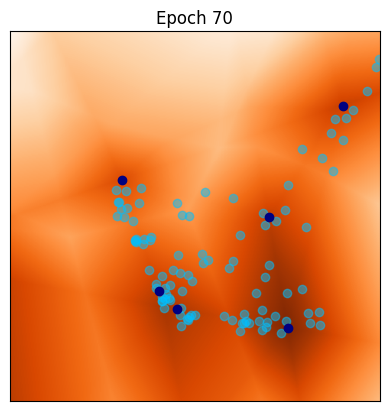

[71/100] 	Loss_D: -0.0783	Loss_G: -13.5560	Lip(D)=1.2615
[72/100] 	Loss_D: -0.0707	Loss_G: -13.1264	Lip(D)=1.3621
[73/100] 	Loss_D: -0.0813	Loss_G: -16.2842	Lip(D)=1.3713
[74/100] 	Loss_D: -0.1017	Loss_G: -16.9427	Lip(D)=1.4268
[75/100] 	Loss_D: -0.0778	Loss_G: -14.6228	Lip(D)=1.2359


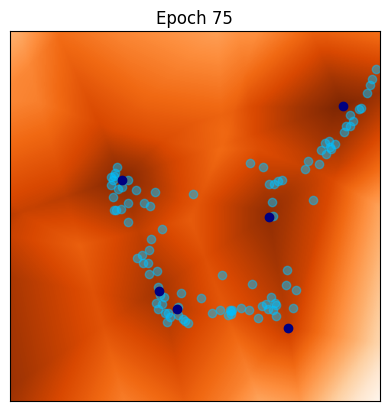

[76/100] 	Loss_D: -0.0833	Loss_G: -16.0222	Lip(D)=1.2453
[77/100] 	Loss_D: -0.0840	Loss_G: -18.2773	Lip(D)=1.4187
[78/100] 	Loss_D: -0.0951	Loss_G: -19.9626	Lip(D)=1.3563
[79/100] 	Loss_D: -0.0518	Loss_G: -18.7868	Lip(D)=1.2630
[80/100] 	Loss_D: -0.0837	Loss_G: -19.8405	Lip(D)=1.2521


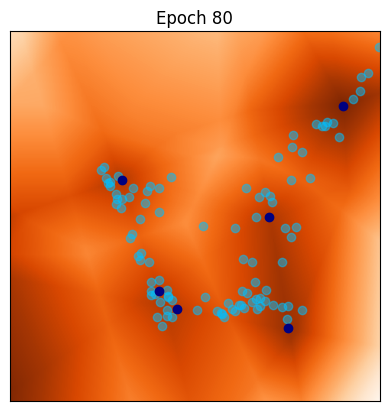

[81/100] 	Loss_D: -0.0685	Loss_G: -19.3374	Lip(D)=1.3105
[82/100] 	Loss_D: -0.0849	Loss_G: -19.1090	Lip(D)=1.3318
[83/100] 	Loss_D: -0.0629	Loss_G: -21.9907	Lip(D)=1.3807
[84/100] 	Loss_D: -0.0741	Loss_G: -23.0106	Lip(D)=1.5658
[85/100] 	Loss_D: -0.0727	Loss_G: -25.8384	Lip(D)=1.2390


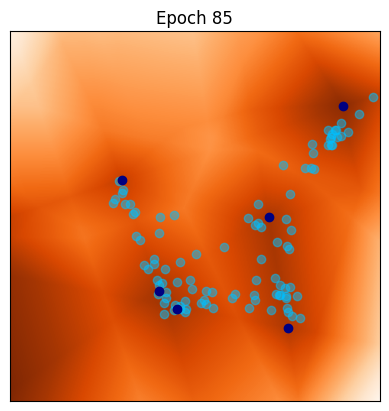

[86/100] 	Loss_D: -0.0778	Loss_G: -25.4354	Lip(D)=1.2914
[87/100] 	Loss_D: -0.0646	Loss_G: -24.9149	Lip(D)=1.3115
[88/100] 	Loss_D: -0.0876	Loss_G: -26.5851	Lip(D)=1.3392
[89/100] 	Loss_D: -0.0913	Loss_G: -27.2803	Lip(D)=1.1072
[90/100] 	Loss_D: -0.1017	Loss_G: -28.8147	Lip(D)=1.2273


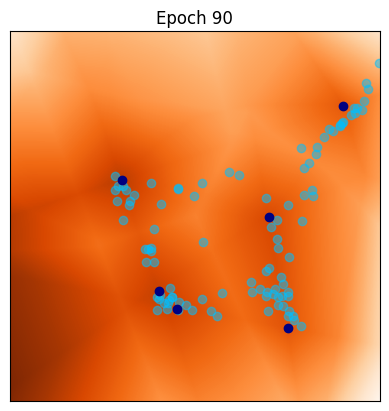

[91/100] 	Loss_D: -0.0718	Loss_G: -28.6583	Lip(D)=1.1841
[92/100] 	Loss_D: -0.0617	Loss_G: -28.7552	Lip(D)=1.2707
[93/100] 	Loss_D: -0.0140	Loss_G: -29.3397	Lip(D)=1.2171
[94/100] 	Loss_D: -0.0742	Loss_G: -27.9393	Lip(D)=1.3754
[95/100] 	Loss_D: -0.0819	Loss_G: -33.2387	Lip(D)=1.1723


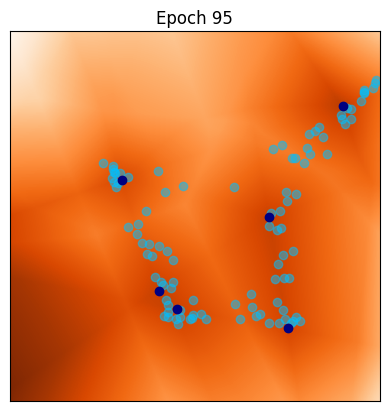

[96/100] 	Loss_D: -0.0735	Loss_G: -30.7456	Lip(D)=1.1808
[97/100] 	Loss_D: -0.0690	Loss_G: -29.7384	Lip(D)=1.2128
[98/100] 	Loss_D: -0.0654	Loss_G: -33.6012	Lip(D)=1.5610
[99/100] 	Loss_D: -0.0765	Loss_G: -32.3955	Lip(D)=1.3109


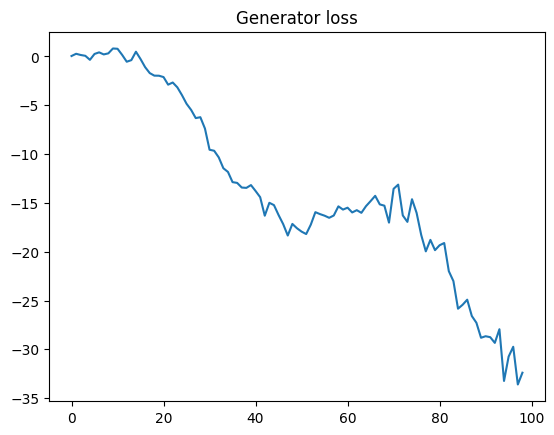

<All keys matched successfully>

In [16]:
## parameters for training
n_epochs = 100
niterD=1000
niterG=10
gpw = .1

lr = 0.002      # learning rate for generator
lrdisc = 0.002  # learning rate for discriminator
beta_1 = 0.5
beta_2 = 0.999

torch.manual_seed(1)  # initialize random seed for reproducibility

# Initialize generators and discriminators
G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
optimG = optim.Adam(G.parameters(), lr=lr)

D = Discriminator(n_in=d, n_hid=10).to(device)
optimD = optim.Adam(D.parameters(), lr=lrdisc, betas=(beta_1, beta_2))


Glosses = []
Dlosses = []

iter_display = 5

# Main loop
for epoch in range(1,n_epochs):

    ############################
    ### Train discriminator (niterD iterations)
    ############################

    for iter in range(0,niterD):
        optimD.zero_grad()

        z = torch.randn((b, n_in), device=device)
        x = G(z)
        gp = gradient_penalty(D, x.detach(), y)
        Dloss = -torch.mean(D(y)) + torch.mean(D(x.detach())) + gpw * gp

        Dloss.backward()
        optimD.step()

    ############################
    ### Train generator (niterG iterations)
    ############################
    for iter in range(0,niterG):
        optimG.zero_grad()

        z = torch.randn((b, n_in), device=device)
        x = G(z)
        Gloss = -torch.mean(D(x))

        Gloss.backward()
        optimG.step()

    # Output training stats
    print('[%d/%d] \tLoss_D: %.4f\tLoss_G: %.4f\tLip(D)=%.4f'
      % (epoch, n_epochs, Dloss.item(), Gloss.item(),lipconstant(D,x,y).item()))
    Glosses.append(Gloss.item())
    Dlosses.append(Dloss.item())

    if(epoch % iter_display == 0):
        Dxgrid = D(xgrid).detach().cpu().numpy().reshape(nr,nc)
        z = torch.randn(b, n_in, device=device)
        x = G(z)
        xd = x.detach().squeeze(1)
        strtitle = 'Epoch '+str(epoch)
        fig = plt.figure(dpi=100)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(Dxgrid,cmap = 'Oranges', extent=extent)
        plt.scatter(xd[:, 0].cpu(), xd[:,1].cpu(),c='deepskyblue',alpha=.5)
        plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
        plt.title(strtitle)
        plt.show()


plt.figure(dpi=100)
plt.plot(Glosses)
plt.title('Generator loss')
plt.show()

# Save final generator for later use
wgan = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
wgan.load_state_dict(G.state_dict())

## Sensitivy to hyper-parameters

QUESTION: Repeat the WGAN learning experiment, by changing the parameters of the optimization (learning rates, number of updates of D and G, etc).

From your experiments, can you draw a few recommendations for stable training?

**Answer :**

* **Discriminator/Generator Learning Rate (`lrdisc` and `lr`):** The generator's learning rate should be slightely lower than or equal to the discriminator's learning rate. Values in the range of `lr = 0.0001` to `lr = 0.0002` helps in stabilizing the training.

* **Discriminator/Generator Updates (`niterD` and `niterD`) :** More frequent updates of the discriminator in comparison to the generator help in ensuring the discriminator does not get too weak and help maintain stability.

* **Gradient Penalty Weight (`gpw`) :**
value of `gpw = 1` is found to be effective. Lower values might weaken the penalty, whereas excessively high values could lead to vanishing gradients.

[1/100] 	Loss_D: -0.0740	Loss_G: 0.1619	Lip(D)=1.0318
[2/100] 	Loss_D: -0.0725	Loss_G: -0.5321	Lip(D)=1.0276
[3/100] 	Loss_D: -0.1093	Loss_G: -0.8644	Lip(D)=1.0569
[4/100] 	Loss_D: -0.1094	Loss_G: -1.3248	Lip(D)=0.9955
[5/100] 	Loss_D: -0.0728	Loss_G: -1.8610	Lip(D)=1.0570


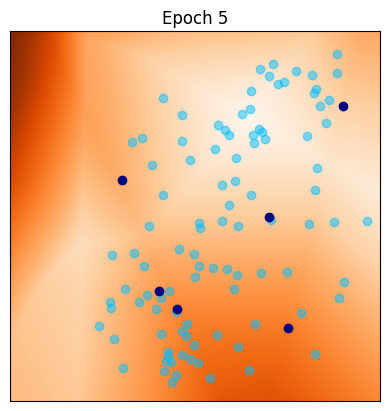

[6/100] 	Loss_D: -0.0951	Loss_G: -1.7654	Lip(D)=0.9973
[7/100] 	Loss_D: -0.1544	Loss_G: -1.7924	Lip(D)=1.0695
[8/100] 	Loss_D: -0.0994	Loss_G: -2.1413	Lip(D)=0.9832
[9/100] 	Loss_D: -0.0940	Loss_G: -2.5417	Lip(D)=1.0583
[10/100] 	Loss_D: -0.0316	Loss_G: -2.7872	Lip(D)=1.0382


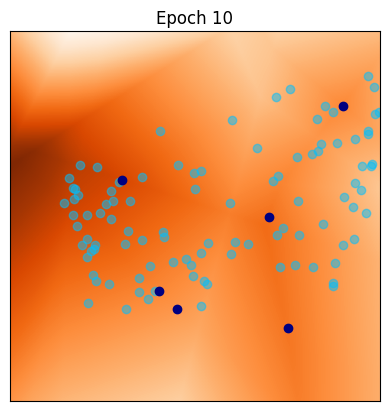

[11/100] 	Loss_D: -0.1177	Loss_G: -3.0260	Lip(D)=0.9517
[12/100] 	Loss_D: -0.1286	Loss_G: -3.3464	Lip(D)=1.0040
[13/100] 	Loss_D: -0.1086	Loss_G: -3.5498	Lip(D)=1.1106
[14/100] 	Loss_D: -0.1055	Loss_G: -3.6765	Lip(D)=1.0121
[15/100] 	Loss_D: -0.0625	Loss_G: -4.2963	Lip(D)=1.0604


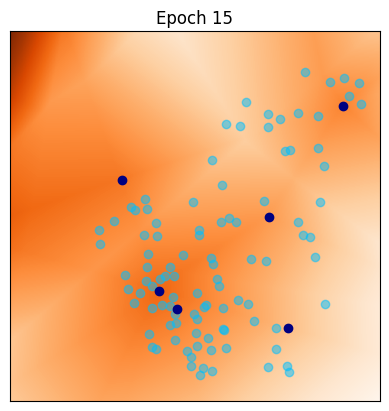

[16/100] 	Loss_D: 0.0219	Loss_G: -5.8708	Lip(D)=0.9688
[17/100] 	Loss_D: -0.1296	Loss_G: -5.8825	Lip(D)=1.0981
[18/100] 	Loss_D: -0.0986	Loss_G: -5.8571	Lip(D)=1.0742
[19/100] 	Loss_D: -0.0706	Loss_G: -6.5276	Lip(D)=1.0710
[20/100] 	Loss_D: -0.1478	Loss_G: -6.0629	Lip(D)=1.0729


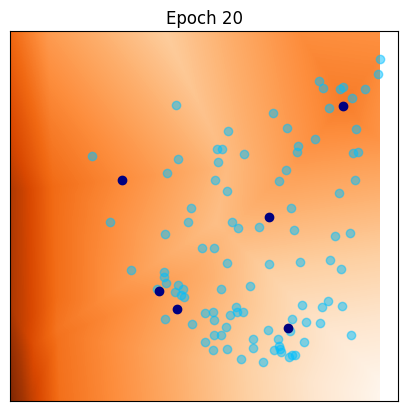

[21/100] 	Loss_D: -0.0910	Loss_G: -6.6129	Lip(D)=1.0243
[22/100] 	Loss_D: -0.0447	Loss_G: -7.4353	Lip(D)=1.0228
[23/100] 	Loss_D: -0.0741	Loss_G: -8.0668	Lip(D)=1.0374
[24/100] 	Loss_D: -0.1091	Loss_G: -8.3215	Lip(D)=1.0631
[25/100] 	Loss_D: -0.0540	Loss_G: -8.1259	Lip(D)=0.9652


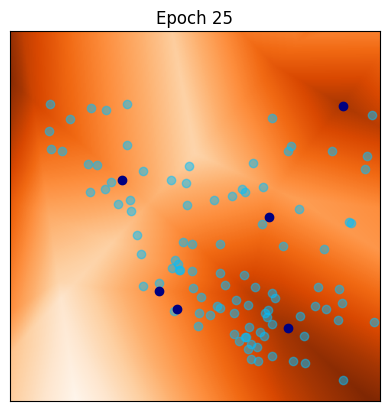

[26/100] 	Loss_D: -0.0709	Loss_G: -8.4020	Lip(D)=1.0744
[27/100] 	Loss_D: -0.1145	Loss_G: -8.6310	Lip(D)=1.0061
[28/100] 	Loss_D: -0.0682	Loss_G: -8.8418	Lip(D)=1.0251
[29/100] 	Loss_D: -0.1143	Loss_G: -9.7958	Lip(D)=1.0725
[30/100] 	Loss_D: -0.0966	Loss_G: -10.6918	Lip(D)=1.0537


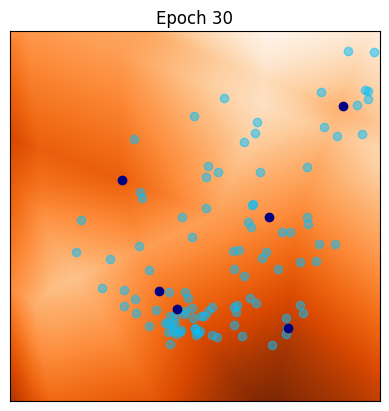

[31/100] 	Loss_D: -0.0356	Loss_G: -11.1772	Lip(D)=1.0413
[32/100] 	Loss_D: -0.1438	Loss_G: -11.8855	Lip(D)=1.0730
[33/100] 	Loss_D: -0.0911	Loss_G: -12.3360	Lip(D)=1.0657
[34/100] 	Loss_D: -0.0924	Loss_G: -13.4527	Lip(D)=1.0341
[35/100] 	Loss_D: -0.0661	Loss_G: -14.5018	Lip(D)=1.0266


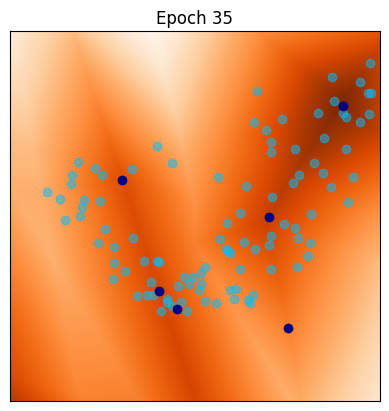

[36/100] 	Loss_D: -0.0987	Loss_G: -14.3271	Lip(D)=1.0873
[37/100] 	Loss_D: -0.1068	Loss_G: -14.0565	Lip(D)=1.0213
[38/100] 	Loss_D: -0.1014	Loss_G: -14.8784	Lip(D)=1.0241
[39/100] 	Loss_D: -0.0641	Loss_G: -15.5527	Lip(D)=1.0257
[40/100] 	Loss_D: -0.0840	Loss_G: -15.6022	Lip(D)=1.0729


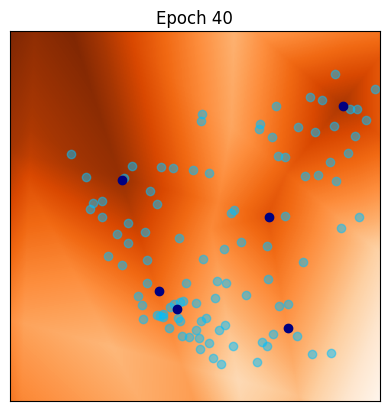

[41/100] 	Loss_D: -0.0907	Loss_G: -16.4698	Lip(D)=1.0720
[42/100] 	Loss_D: -0.0692	Loss_G: -17.5840	Lip(D)=1.0076
[43/100] 	Loss_D: -0.0887	Loss_G: -17.8960	Lip(D)=1.0924
[44/100] 	Loss_D: -0.0822	Loss_G: -18.1621	Lip(D)=1.0800
[45/100] 	Loss_D: -0.0844	Loss_G: -18.7663	Lip(D)=1.0234


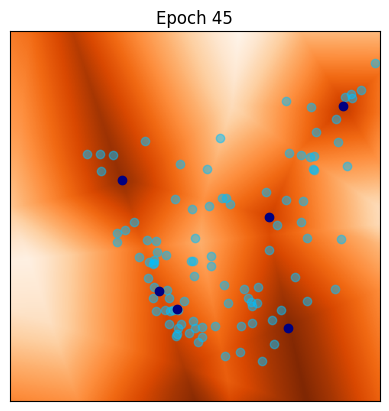

[46/100] 	Loss_D: -0.0726	Loss_G: -20.0936	Lip(D)=1.0212
[47/100] 	Loss_D: -0.0825	Loss_G: -20.4246	Lip(D)=1.1097
[48/100] 	Loss_D: -0.0610	Loss_G: -21.5108	Lip(D)=1.0343
[49/100] 	Loss_D: -0.0943	Loss_G: -22.3763	Lip(D)=0.9895
[50/100] 	Loss_D: -0.0799	Loss_G: -22.8815	Lip(D)=1.0883


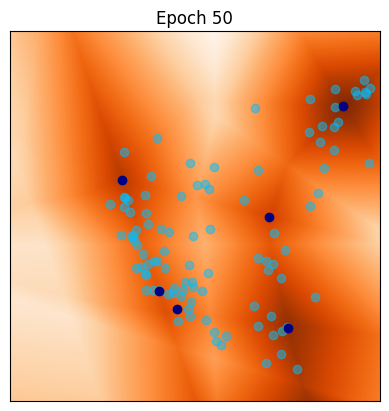

[51/100] 	Loss_D: -0.0801	Loss_G: -23.4762	Lip(D)=1.0013
[52/100] 	Loss_D: -0.0778	Loss_G: -24.1911	Lip(D)=0.9915
[53/100] 	Loss_D: -0.0648	Loss_G: -24.8028	Lip(D)=1.1092
[54/100] 	Loss_D: -0.0552	Loss_G: -25.5904	Lip(D)=1.0631
[55/100] 	Loss_D: -0.0654	Loss_G: -26.6098	Lip(D)=1.0237


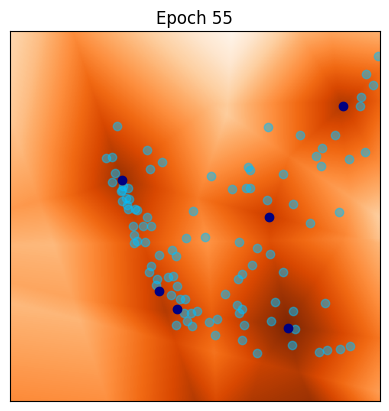

[56/100] 	Loss_D: -0.0827	Loss_G: -27.2432	Lip(D)=1.0106
[57/100] 	Loss_D: -0.0644	Loss_G: -27.9030	Lip(D)=1.0168
[58/100] 	Loss_D: -0.0700	Loss_G: -28.3462	Lip(D)=1.0315
[59/100] 	Loss_D: -0.0581	Loss_G: -28.8601	Lip(D)=0.9759
[60/100] 	Loss_D: -0.0728	Loss_G: -29.9052	Lip(D)=1.0053


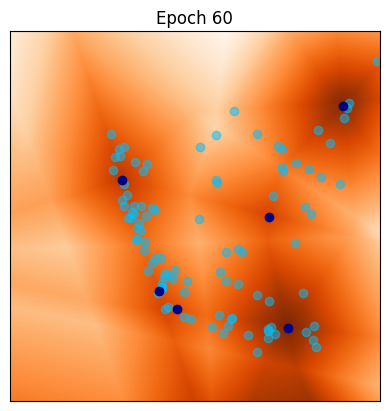

[61/100] 	Loss_D: -0.0337	Loss_G: -30.6284	Lip(D)=1.0679
[62/100] 	Loss_D: -0.0708	Loss_G: -31.2698	Lip(D)=1.0845
[63/100] 	Loss_D: -0.0792	Loss_G: -31.5996	Lip(D)=1.0694
[64/100] 	Loss_D: -0.0685	Loss_G: -32.0904	Lip(D)=1.0824
[65/100] 	Loss_D: -0.0469	Loss_G: -32.4994	Lip(D)=0.9930


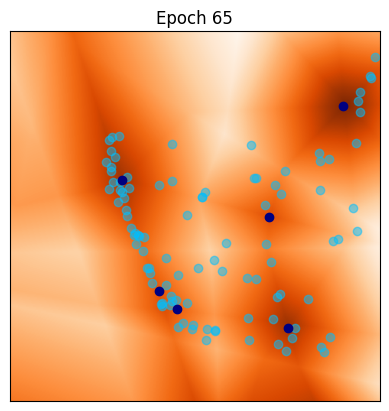

[66/100] 	Loss_D: -0.0637	Loss_G: -32.9107	Lip(D)=1.0087
[67/100] 	Loss_D: -0.0521	Loss_G: -33.4710	Lip(D)=1.0054
[68/100] 	Loss_D: -0.0652	Loss_G: -34.4502	Lip(D)=1.0011
[69/100] 	Loss_D: -0.0695	Loss_G: -34.1755	Lip(D)=1.0330
[70/100] 	Loss_D: -0.0533	Loss_G: -34.5558	Lip(D)=1.0291


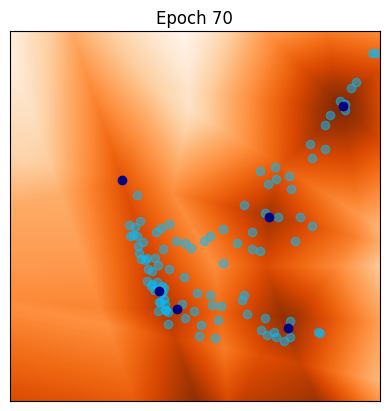

[71/100] 	Loss_D: -0.0682	Loss_G: -35.4242	Lip(D)=1.0389
[72/100] 	Loss_D: -0.0534	Loss_G: -36.5630	Lip(D)=1.0307
[73/100] 	Loss_D: -0.0719	Loss_G: -36.5491	Lip(D)=1.0052
[74/100] 	Loss_D: -0.0594	Loss_G: -35.8961	Lip(D)=1.0199
[75/100] 	Loss_D: -0.0800	Loss_G: -37.0390	Lip(D)=1.0648


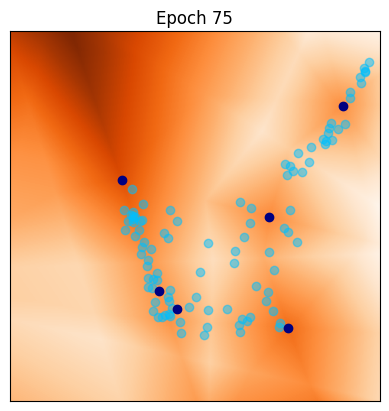

[76/100] 	Loss_D: -0.0807	Loss_G: -38.8625	Lip(D)=0.9622
[77/100] 	Loss_D: -0.0602	Loss_G: -39.5260	Lip(D)=1.0770
[78/100] 	Loss_D: -0.0851	Loss_G: -36.8774	Lip(D)=1.0430
[79/100] 	Loss_D: -0.0633	Loss_G: -36.4922	Lip(D)=1.0483
[80/100] 	Loss_D: -0.0814	Loss_G: -38.9951	Lip(D)=0.9993


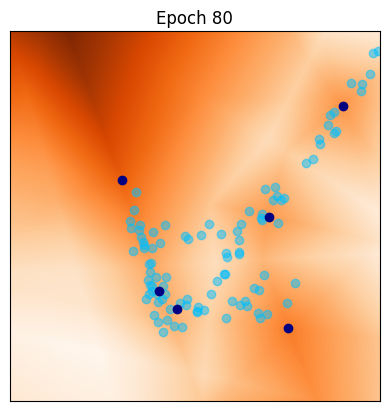

[81/100] 	Loss_D: -0.0824	Loss_G: -39.2957	Lip(D)=1.0066
[82/100] 	Loss_D: -0.0797	Loss_G: -40.1410	Lip(D)=1.0492
[83/100] 	Loss_D: -0.1001	Loss_G: -37.2305	Lip(D)=1.0407
[84/100] 	Loss_D: -0.0825	Loss_G: -38.3718	Lip(D)=1.0761
[85/100] 	Loss_D: -0.0762	Loss_G: -42.2307	Lip(D)=0.9913


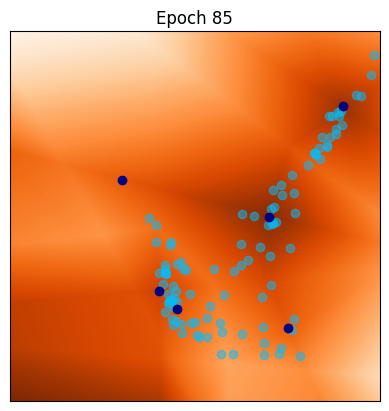

[86/100] 	Loss_D: -0.0848	Loss_G: -44.8185	Lip(D)=0.9720
[87/100] 	Loss_D: -0.0926	Loss_G: -40.7250	Lip(D)=1.0760
[88/100] 	Loss_D: -0.0871	Loss_G: -43.3358	Lip(D)=1.0669
[89/100] 	Loss_D: -0.0801	Loss_G: -45.3052	Lip(D)=1.0412
[90/100] 	Loss_D: -0.0924	Loss_G: -45.8912	Lip(D)=1.0213


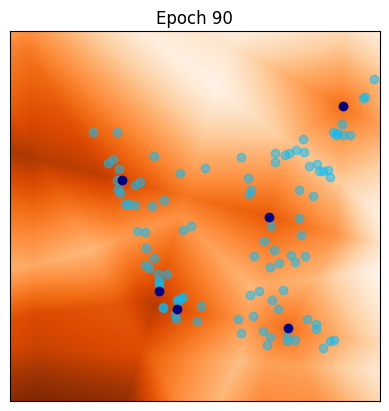

[91/100] 	Loss_D: -0.0906	Loss_G: -48.0134	Lip(D)=1.0465
[92/100] 	Loss_D: -0.0712	Loss_G: -49.2623	Lip(D)=1.0555
[93/100] 	Loss_D: -0.0587	Loss_G: -50.2827	Lip(D)=1.0048
[94/100] 	Loss_D: -0.0815	Loss_G: -51.5955	Lip(D)=1.0519
[95/100] 	Loss_D: -0.0706	Loss_G: -52.3809	Lip(D)=1.0314


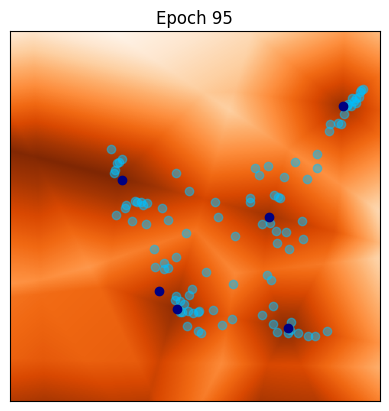

[96/100] 	Loss_D: -0.0687	Loss_G: -52.5687	Lip(D)=1.0150
[97/100] 	Loss_D: -0.0644	Loss_G: -53.3048	Lip(D)=1.0476
[98/100] 	Loss_D: -0.0762	Loss_G: -53.4441	Lip(D)=1.0633
[99/100] 	Loss_D: -0.0684	Loss_G: -53.8567	Lip(D)=1.0281


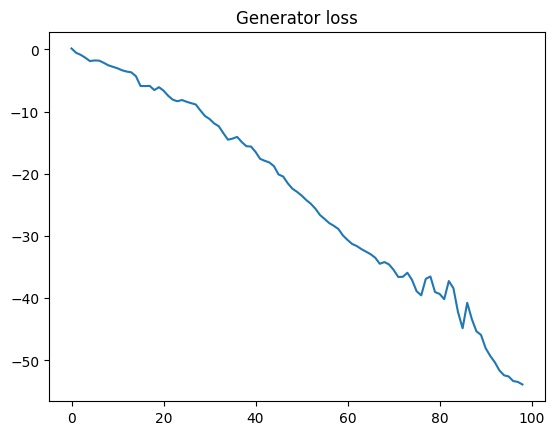

<All keys matched successfully>

In [17]:
## parameters for training
n_epochs = 100
niterD=1000
niterG=10
gpw = 1

lr = 0.002      # learning rate for generator
lrdisc = 0.002  # learning rate for discriminator
beta_1 = 0.5
beta_2 = 0.999

torch.manual_seed(1)  # initialize random seed for reproducibility

# Initialize generators and discriminators
G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
optimG = optim.Adam(G.parameters(), lr=lr)

D = Discriminator(n_in=d, n_hid=10).to(device)
optimD = optim.Adam(D.parameters(), lr=lrdisc, betas=(beta_1, beta_2))


Glosses = []
Dlosses = []

iter_display = 5

# Main loop
for epoch in range(1,n_epochs):

    ############################
    ### Train discriminator (niterD iterations)
    ############################

    for iter in range(0,niterD):
        optimD.zero_grad()

        z = torch.randn((b, n_in), device=device)
        x = G(z)
        gp = gradient_penalty(D, x.detach(), y)
        Dloss = -torch.mean(D(y)) + torch.mean(D(x.detach())) + gpw * gp

        Dloss.backward()
        optimD.step()

    ############################
    ### Train generator (niterG iterations)
    ############################
    for iter in range(0,niterG):
        optimG.zero_grad()

        z = torch.randn((b, n_in), device=device)
        x = G(z)
        Gloss = -torch.mean(D(x))

        Gloss.backward()
        optimG.step()

    # Output training stats
    print('[%d/%d] \tLoss_D: %.4f\tLoss_G: %.4f\tLip(D)=%.4f'
      % (epoch, n_epochs, Dloss.item(), Gloss.item(),lipconstant(D,x,y).item()))
    Glosses.append(Gloss.item())
    Dlosses.append(Dloss.item())

    if(epoch % iter_display == 0):
        Dxgrid = D(xgrid).detach().cpu().numpy().reshape(nr,nc)
        z = torch.randn(b, n_in, device=device)
        x = G(z)
        xd = x.detach().squeeze(1)
        strtitle = 'Epoch '+str(epoch)
        fig = plt.figure(dpi=100)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(Dxgrid,cmap = 'Oranges', extent=extent)
        plt.scatter(xd[:, 0].cpu(), xd[:,1].cpu(),c='deepskyblue',alpha=.5)
        plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
        plt.title(strtitle)
        plt.show()


plt.figure(dpi=100)
plt.plot(Glosses)
plt.title('Generator loss')
plt.show()

# Save final generator for later use
wgan = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
wgan.load_state_dict(G.state_dict())

[1/100] 	Loss_D: -0.0740	Loss_G: 0.2061	Lip(D)=1.0348
[2/100] 	Loss_D: -0.0698	Loss_G: -0.6860	Lip(D)=1.0120
[3/100] 	Loss_D: -0.0381	Loss_G: -0.6658	Lip(D)=1.0374
[4/100] 	Loss_D: -0.1343	Loss_G: -1.1465	Lip(D)=1.0104
[5/100] 	Loss_D: -0.0983	Loss_G: -1.2991	Lip(D)=1.0615


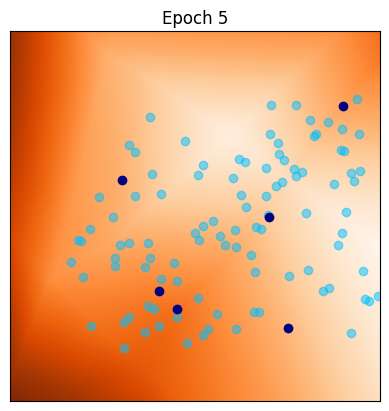

[6/100] 	Loss_D: -0.0919	Loss_G: -1.5617	Lip(D)=1.0176
[7/100] 	Loss_D: -0.0836	Loss_G: -1.8971	Lip(D)=0.9773
[8/100] 	Loss_D: -0.0784	Loss_G: -2.0861	Lip(D)=0.9095
[9/100] 	Loss_D: -0.0469	Loss_G: -2.3326	Lip(D)=1.0222
[10/100] 	Loss_D: -0.0546	Loss_G: -2.5728	Lip(D)=1.0315


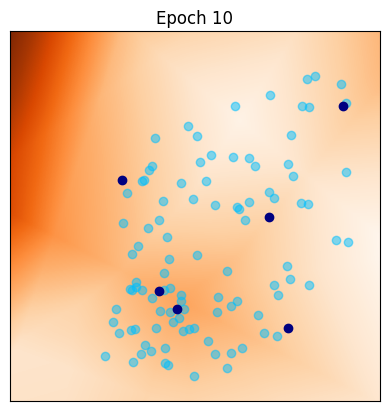

[11/100] 	Loss_D: -0.0909	Loss_G: -2.3413	Lip(D)=1.0220
[12/100] 	Loss_D: -0.0836	Loss_G: -2.4792	Lip(D)=1.0514
[13/100] 	Loss_D: -0.0564	Loss_G: -2.7168	Lip(D)=1.0837
[14/100] 	Loss_D: -0.0694	Loss_G: -3.4022	Lip(D)=1.0776
[15/100] 	Loss_D: -0.0594	Loss_G: -3.6815	Lip(D)=1.0464


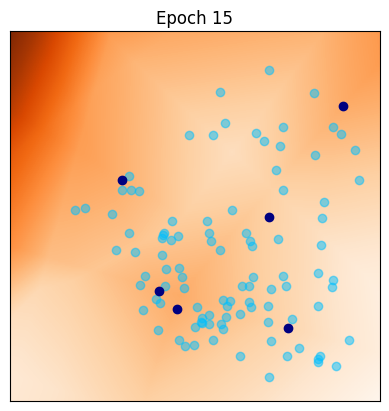

[16/100] 	Loss_D: -0.0660	Loss_G: -4.0055	Lip(D)=1.0334
[17/100] 	Loss_D: -0.0430	Loss_G: -4.2767	Lip(D)=1.0335
[18/100] 	Loss_D: -0.0882	Loss_G: -3.6725	Lip(D)=1.0349
[19/100] 	Loss_D: -0.0944	Loss_G: -3.9695	Lip(D)=1.0473
[20/100] 	Loss_D: -0.0664	Loss_G: -4.5073	Lip(D)=1.0601


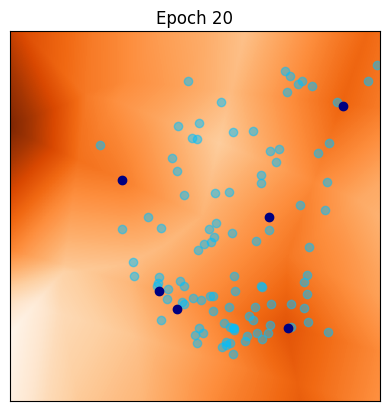

[21/100] 	Loss_D: -0.0369	Loss_G: -5.1258	Lip(D)=1.0106
[22/100] 	Loss_D: -0.0963	Loss_G: -5.4326	Lip(D)=1.0048
[23/100] 	Loss_D: -0.1087	Loss_G: -5.5798	Lip(D)=1.0594
[24/100] 	Loss_D: -0.0750	Loss_G: -5.5984	Lip(D)=1.0672
[25/100] 	Loss_D: -0.0975	Loss_G: -5.2020	Lip(D)=1.0814


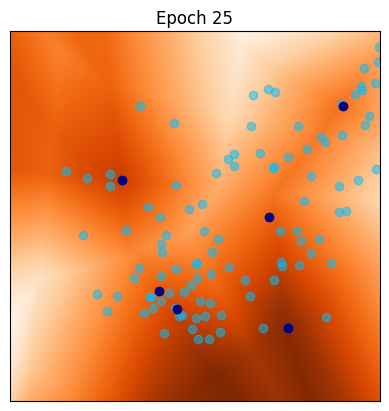

[26/100] 	Loss_D: -0.1109	Loss_G: -5.3315	Lip(D)=1.0728
[27/100] 	Loss_D: -0.0979	Loss_G: -5.4358	Lip(D)=0.9022
[28/100] 	Loss_D: -0.0911	Loss_G: -5.6153	Lip(D)=1.0236
[29/100] 	Loss_D: -0.0968	Loss_G: -5.9680	Lip(D)=1.0511
[30/100] 	Loss_D: -0.1057	Loss_G: -6.1328	Lip(D)=1.0442


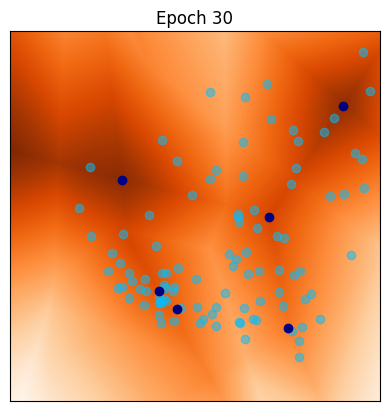

[31/100] 	Loss_D: -0.0814	Loss_G: -6.1586	Lip(D)=1.0758
[32/100] 	Loss_D: -0.0954	Loss_G: -6.4205	Lip(D)=1.0469
[33/100] 	Loss_D: -0.0964	Loss_G: -6.7177	Lip(D)=1.0536
[34/100] 	Loss_D: -0.0961	Loss_G: -6.8793	Lip(D)=1.0544
[35/100] 	Loss_D: -0.0866	Loss_G: -7.2427	Lip(D)=1.0152


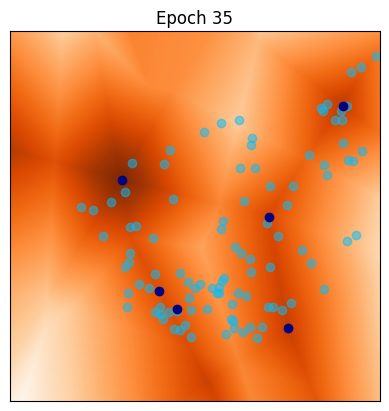

[36/100] 	Loss_D: -0.0891	Loss_G: -7.4929	Lip(D)=1.0302
[37/100] 	Loss_D: -0.0846	Loss_G: -7.8437	Lip(D)=1.0412
[38/100] 	Loss_D: -0.0933	Loss_G: -8.0788	Lip(D)=1.0459
[39/100] 	Loss_D: -0.0920	Loss_G: -8.5199	Lip(D)=1.0411
[40/100] 	Loss_D: -0.0748	Loss_G: -9.2317	Lip(D)=1.0553


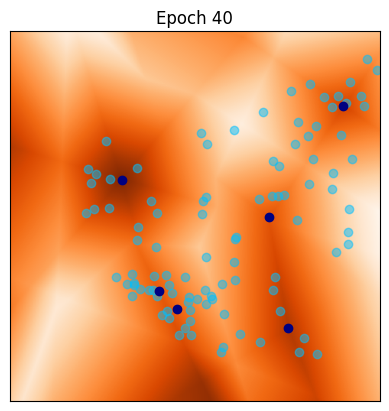

[41/100] 	Loss_D: -0.0969	Loss_G: -9.4481	Lip(D)=1.0814
[42/100] 	Loss_D: -0.0764	Loss_G: -9.8057	Lip(D)=1.0207
[43/100] 	Loss_D: -0.0873	Loss_G: -10.0147	Lip(D)=1.0660
[44/100] 	Loss_D: -0.0930	Loss_G: -10.2927	Lip(D)=1.0769
[45/100] 	Loss_D: -0.0935	Loss_G: -10.6236	Lip(D)=1.0227


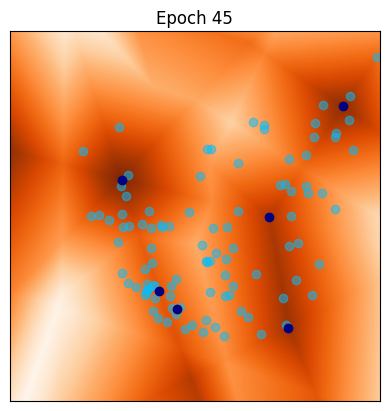

[46/100] 	Loss_D: -0.0788	Loss_G: -10.9932	Lip(D)=1.0527
[47/100] 	Loss_D: -0.0938	Loss_G: -11.1144	Lip(D)=1.0487
[48/100] 	Loss_D: -0.0850	Loss_G: -11.4724	Lip(D)=1.0400
[49/100] 	Loss_D: -0.0853	Loss_G: -11.8784	Lip(D)=1.0688
[50/100] 	Loss_D: -0.0801	Loss_G: -12.1008	Lip(D)=1.0341


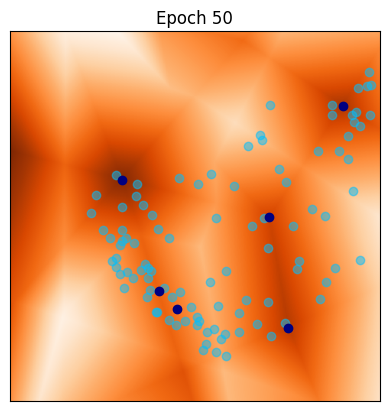

[51/100] 	Loss_D: -0.0952	Loss_G: -12.5208	Lip(D)=1.0454
[52/100] 	Loss_D: -0.0915	Loss_G: -12.5260	Lip(D)=1.0237
[53/100] 	Loss_D: -0.0840	Loss_G: -12.9131	Lip(D)=1.0446
[54/100] 	Loss_D: -0.0758	Loss_G: -13.1738	Lip(D)=1.0405
[55/100] 	Loss_D: -0.0822	Loss_G: -13.5565	Lip(D)=1.0541


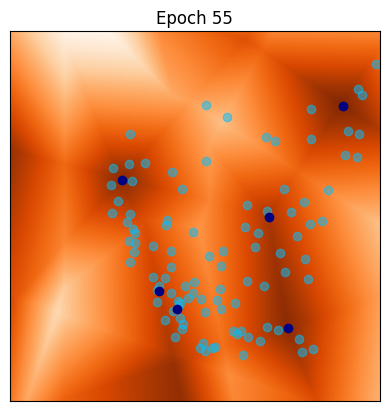

[56/100] 	Loss_D: -0.0819	Loss_G: -13.9169	Lip(D)=1.0413
[57/100] 	Loss_D: -0.0853	Loss_G: -14.1639	Lip(D)=1.0099
[58/100] 	Loss_D: -0.0780	Loss_G: -14.3038	Lip(D)=1.0472
[59/100] 	Loss_D: -0.0822	Loss_G: -14.6583	Lip(D)=1.0271
[60/100] 	Loss_D: -0.0765	Loss_G: -14.8221	Lip(D)=1.0533


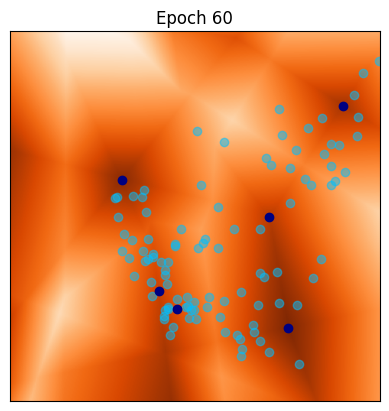

[61/100] 	Loss_D: -0.0814	Loss_G: -15.2559	Lip(D)=1.0338
[62/100] 	Loss_D: -0.0822	Loss_G: -15.6290	Lip(D)=1.0758
[63/100] 	Loss_D: -0.0815	Loss_G: -15.5407	Lip(D)=1.0035
[64/100] 	Loss_D: -0.0750	Loss_G: -15.8837	Lip(D)=1.0317
[65/100] 	Loss_D: -0.0836	Loss_G: -16.3760	Lip(D)=1.0194


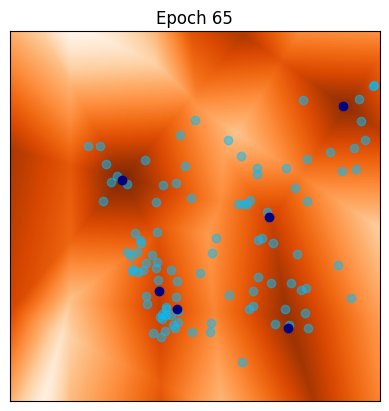

[66/100] 	Loss_D: -0.0907	Loss_G: -16.3202	Lip(D)=1.0343
[67/100] 	Loss_D: -0.0811	Loss_G: -16.7420	Lip(D)=1.0188
[68/100] 	Loss_D: -0.0853	Loss_G: -17.0078	Lip(D)=1.0267
[69/100] 	Loss_D: -0.0813	Loss_G: -17.4035	Lip(D)=1.0462
[70/100] 	Loss_D: -0.0897	Loss_G: -17.2565	Lip(D)=1.0427


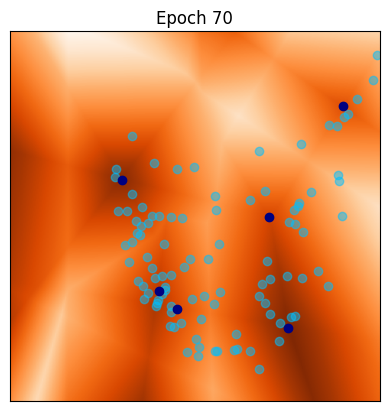

[71/100] 	Loss_D: -0.0850	Loss_G: -17.6313	Lip(D)=1.0163
[72/100] 	Loss_D: -0.0712	Loss_G: -17.6459	Lip(D)=1.0288
[73/100] 	Loss_D: -0.0810	Loss_G: -18.1269	Lip(D)=1.0463
[74/100] 	Loss_D: -0.0741	Loss_G: -18.2779	Lip(D)=1.0201
[75/100] 	Loss_D: -0.0632	Loss_G: -18.7404	Lip(D)=1.0308


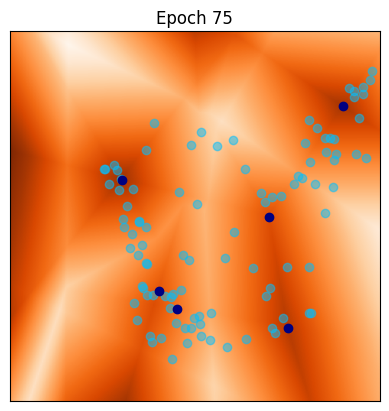

[76/100] 	Loss_D: -0.0868	Loss_G: -18.9892	Lip(D)=1.0109
[77/100] 	Loss_D: -0.0877	Loss_G: -19.0430	Lip(D)=1.0669
[78/100] 	Loss_D: -0.0846	Loss_G: -19.3084	Lip(D)=1.0298
[79/100] 	Loss_D: -0.0684	Loss_G: -19.6675	Lip(D)=1.0239
[80/100] 	Loss_D: -0.0766	Loss_G: -19.8886	Lip(D)=1.0373


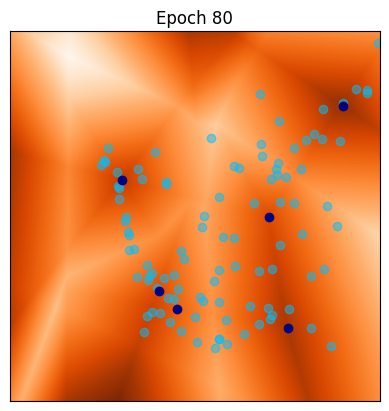

[81/100] 	Loss_D: -0.0750	Loss_G: -20.1459	Lip(D)=1.0543
[82/100] 	Loss_D: -0.0657	Loss_G: -18.6471	Lip(D)=1.1134
[83/100] 	Loss_D: -0.0519	Loss_G: -18.8309	Lip(D)=1.0624
[84/100] 	Loss_D: -0.0745	Loss_G: -19.6063	Lip(D)=1.0052
[85/100] 	Loss_D: -0.0687	Loss_G: -20.0464	Lip(D)=0.9889


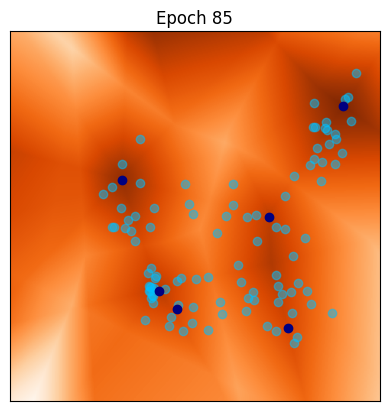

[86/100] 	Loss_D: -0.0828	Loss_G: -20.9159	Lip(D)=1.0080
[87/100] 	Loss_D: -0.0808	Loss_G: -22.0350	Lip(D)=1.0287
[88/100] 	Loss_D: -0.0848	Loss_G: -22.8052	Lip(D)=1.0663
[89/100] 	Loss_D: -0.0813	Loss_G: -23.0182	Lip(D)=0.9998
[90/100] 	Loss_D: -0.0823	Loss_G: -23.6848	Lip(D)=0.9844


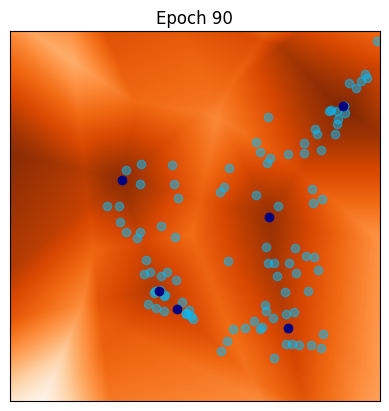

[91/100] 	Loss_D: -0.0728	Loss_G: -24.3697	Lip(D)=1.0188
[92/100] 	Loss_D: -0.0728	Loss_G: -24.6027	Lip(D)=1.0397
[93/100] 	Loss_D: -0.0666	Loss_G: -24.9995	Lip(D)=1.0153
[94/100] 	Loss_D: -0.0797	Loss_G: -25.8882	Lip(D)=1.0662
[95/100] 	Loss_D: -0.0802	Loss_G: -26.5639	Lip(D)=1.0523


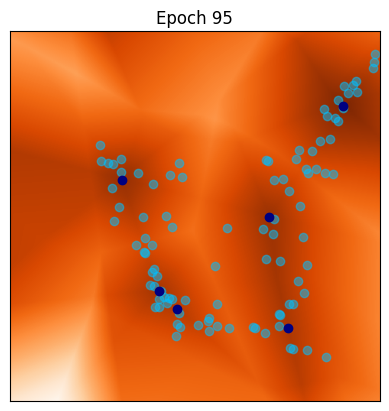

[96/100] 	Loss_D: -0.0770	Loss_G: -27.1480	Lip(D)=1.0133
[97/100] 	Loss_D: -0.0710	Loss_G: -27.8643	Lip(D)=1.0769
[98/100] 	Loss_D: -0.0659	Loss_G: -27.8770	Lip(D)=1.0468
[99/100] 	Loss_D: -0.0706	Loss_G: -28.4355	Lip(D)=0.9700


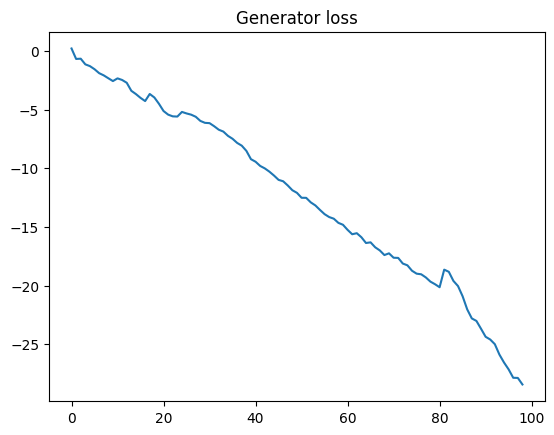

<All keys matched successfully>

In [18]:
## parameters for training
n_epochs = 100
niterD=1000
niterG=10
gpw = 1

lr = 0.001      # learning rate for generator
lrdisc = 0.002  # learning rate for discriminator
beta_1 = 0.5
beta_2 = 0.999

torch.manual_seed(1)  # initialize random seed for reproducibility

# Initialize generators and discriminators
G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
optimG = optim.Adam(G.parameters(), lr=lr)

D = Discriminator(n_in=d, n_hid=10).to(device)
optimD = optim.Adam(D.parameters(), lr=lrdisc, betas=(beta_1, beta_2))


Glosses = []
Dlosses = []

iter_display = 5

# Main loop
for epoch in range(1,n_epochs):

    ############################
    ### Train discriminator (niterD iterations)
    ############################

    for iter in range(0,niterD):
        optimD.zero_grad()

        z = torch.randn((b, n_in), device=device)
        x = G(z)
        gp = gradient_penalty(D, x.detach(), y)
        Dloss = -torch.mean(D(y)) + torch.mean(D(x.detach())) + gpw * gp

        Dloss.backward()
        optimD.step()

    ############################
    ### Train generator (niterG iterations)
    ############################
    for iter in range(0,niterG):
        optimG.zero_grad()

        z = torch.randn((b, n_in), device=device)
        x = G(z)
        Gloss = -torch.mean(D(x))

        Gloss.backward()
        optimG.step()

    # Output training stats
    print('[%d/%d] \tLoss_D: %.4f\tLoss_G: %.4f\tLip(D)=%.4f'
      % (epoch, n_epochs, Dloss.item(), Gloss.item(),lipconstant(D,x,y).item()))
    Glosses.append(Gloss.item())
    Dlosses.append(Dloss.item())

    if(epoch % iter_display == 0):
        Dxgrid = D(xgrid).detach().cpu().numpy().reshape(nr,nc)
        z = torch.randn(b, n_in, device=device)
        x = G(z)
        xd = x.detach().squeeze(1)
        strtitle = 'Epoch '+str(epoch)
        fig = plt.figure(dpi=100)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(Dxgrid,cmap = 'Oranges', extent=extent)
        plt.scatter(xd[:, 0].cpu(), xd[:,1].cpu(),c='deepskyblue',alpha=.5)
        plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
        plt.title(strtitle)
        plt.show()


plt.figure(dpi=100)
plt.plot(Glosses)
plt.title('Generator loss')
plt.show()

# Save final generator for later use
wgan = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
wgan.load_state_dict(G.state_dict())

[1/100] 	Loss_D: -0.0740	Loss_G: 0.1283	Lip(D)=1.0600
[2/100] 	Loss_D: -0.0804	Loss_G: -0.6640	Lip(D)=1.1125
[3/100] 	Loss_D: -0.1282	Loss_G: -1.0234	Lip(D)=1.0790
[4/100] 	Loss_D: -0.0995	Loss_G: -1.3790	Lip(D)=0.9117
[5/100] 	Loss_D: -0.0877	Loss_G: -1.2240	Lip(D)=1.0473


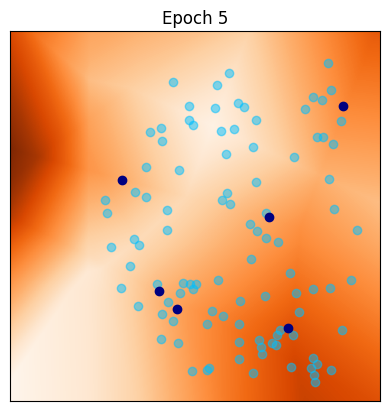

[6/100] 	Loss_D: -0.0438	Loss_G: -0.7647	Lip(D)=0.9587
[7/100] 	Loss_D: -0.0755	Loss_G: -0.9438	Lip(D)=1.0209
[8/100] 	Loss_D: -0.0464	Loss_G: -1.1238	Lip(D)=0.9774
[9/100] 	Loss_D: -0.1433	Loss_G: -1.7206	Lip(D)=0.9994
[10/100] 	Loss_D: -0.0984	Loss_G: -2.2232	Lip(D)=1.0743


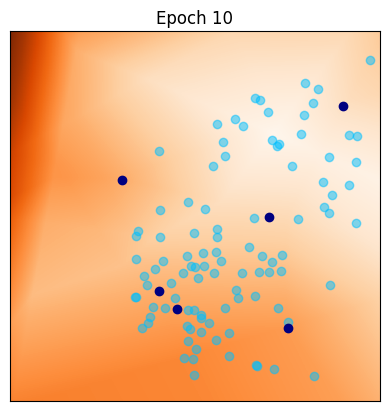

[11/100] 	Loss_D: -0.0256	Loss_G: -2.5621	Lip(D)=0.9461
[12/100] 	Loss_D: -0.1152	Loss_G: -2.1472	Lip(D)=1.0303
[13/100] 	Loss_D: -0.0921	Loss_G: -2.6847	Lip(D)=1.0725
[14/100] 	Loss_D: -0.0747	Loss_G: -2.8250	Lip(D)=1.1352
[15/100] 	Loss_D: -0.1157	Loss_G: -3.4709	Lip(D)=1.0285


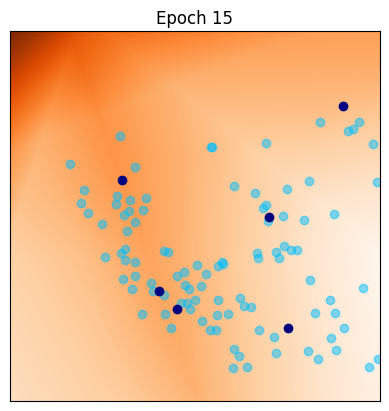

[16/100] 	Loss_D: -0.0708	Loss_G: -3.9177	Lip(D)=1.0391
[17/100] 	Loss_D: -0.0482	Loss_G: -4.3447	Lip(D)=1.0214
[18/100] 	Loss_D: -0.0515	Loss_G: -3.8608	Lip(D)=1.0183
[19/100] 	Loss_D: -0.0616	Loss_G: -4.0285	Lip(D)=1.0044
[20/100] 	Loss_D: -0.0855	Loss_G: -4.3145	Lip(D)=1.0390


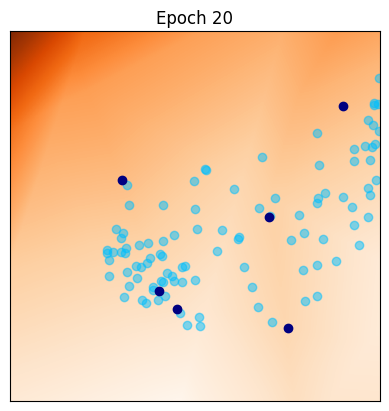

[21/100] 	Loss_D: -0.0815	Loss_G: -5.3037	Lip(D)=1.0403
[22/100] 	Loss_D: -0.0893	Loss_G: -5.7319	Lip(D)=1.0184
[23/100] 	Loss_D: -0.0833	Loss_G: -6.0378	Lip(D)=1.0295
[24/100] 	Loss_D: -0.0716	Loss_G: -5.5827	Lip(D)=1.0194
[25/100] 	Loss_D: -0.0791	Loss_G: -5.2607	Lip(D)=1.0339


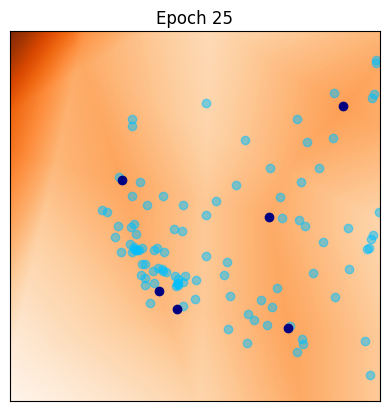

[26/100] 	Loss_D: -0.0786	Loss_G: -4.6778	Lip(D)=1.0297
[27/100] 	Loss_D: -0.0811	Loss_G: -4.4607	Lip(D)=1.0432
[28/100] 	Loss_D: -0.0733	Loss_G: -4.6858	Lip(D)=1.0134
[29/100] 	Loss_D: -0.0587	Loss_G: -4.8439	Lip(D)=1.0348
[30/100] 	Loss_D: -0.0737	Loss_G: -4.7582	Lip(D)=1.0954


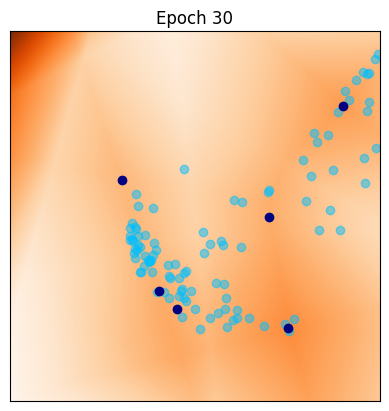

[31/100] 	Loss_D: -0.0628	Loss_G: -5.3552	Lip(D)=0.9557
[32/100] 	Loss_D: -0.0919	Loss_G: -5.2732	Lip(D)=1.1140
[33/100] 	Loss_D: -0.0626	Loss_G: -5.3382	Lip(D)=0.9910
[34/100] 	Loss_D: -0.0630	Loss_G: -5.4282	Lip(D)=0.9089
[35/100] 	Loss_D: -0.0913	Loss_G: -5.6252	Lip(D)=0.9751


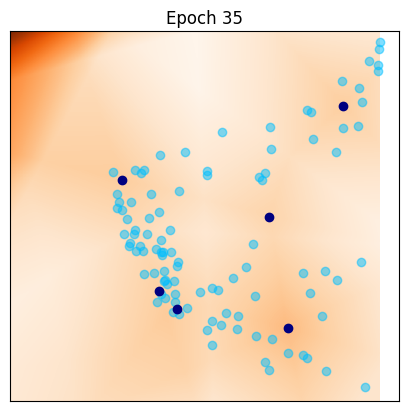

[36/100] 	Loss_D: -0.0786	Loss_G: -5.8603	Lip(D)=1.1257
[37/100] 	Loss_D: -0.0893	Loss_G: -6.2951	Lip(D)=0.9847
[38/100] 	Loss_D: -0.0704	Loss_G: -6.5568	Lip(D)=1.0270
[39/100] 	Loss_D: -0.0779	Loss_G: -7.1033	Lip(D)=1.0221
[40/100] 	Loss_D: -0.0847	Loss_G: -7.7821	Lip(D)=1.0608


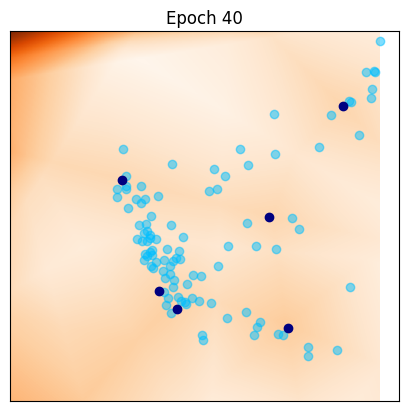

[41/100] 	Loss_D: -0.0724	Loss_G: -8.2012	Lip(D)=1.0691
[42/100] 	Loss_D: -0.0807	Loss_G: -8.6607	Lip(D)=1.0002
[43/100] 	Loss_D: -0.0659	Loss_G: -9.1370	Lip(D)=1.0680
[44/100] 	Loss_D: -0.0696	Loss_G: -9.6328	Lip(D)=1.0306
[45/100] 	Loss_D: -0.0678	Loss_G: -9.9710	Lip(D)=1.0746


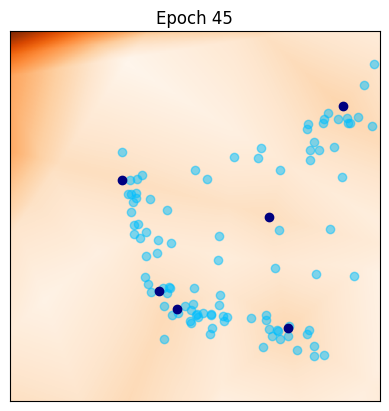

[46/100] 	Loss_D: -0.0818	Loss_G: -10.4692	Lip(D)=1.0053
[47/100] 	Loss_D: -0.0760	Loss_G: -10.9730	Lip(D)=1.0253
[48/100] 	Loss_D: -0.0745	Loss_G: -11.2168	Lip(D)=1.0236
[49/100] 	Loss_D: -0.0770	Loss_G: -11.9484	Lip(D)=1.0396
[50/100] 	Loss_D: -0.0672	Loss_G: -12.5878	Lip(D)=1.0231


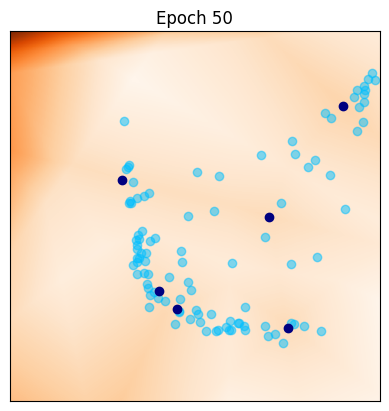

[51/100] 	Loss_D: -0.0691	Loss_G: -13.0206	Lip(D)=1.0157
[52/100] 	Loss_D: -0.0764	Loss_G: -13.5985	Lip(D)=1.0208
[53/100] 	Loss_D: -0.0694	Loss_G: -14.2866	Lip(D)=1.0174
[54/100] 	Loss_D: -0.0403	Loss_G: -14.8957	Lip(D)=0.9879
[55/100] 	Loss_D: -0.0982	Loss_G: -15.6499	Lip(D)=1.0572


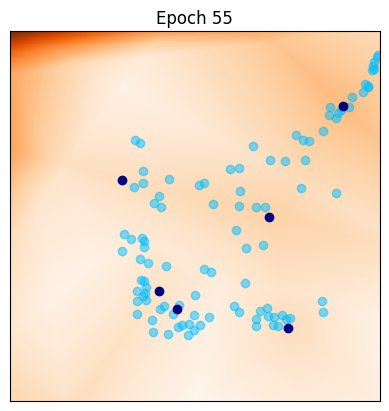

[56/100] 	Loss_D: -0.0757	Loss_G: -16.4081	Lip(D)=1.0337
[57/100] 	Loss_D: -0.0839	Loss_G: -17.3225	Lip(D)=1.0342
[58/100] 	Loss_D: -0.0911	Loss_G: -18.1474	Lip(D)=1.0440
[59/100] 	Loss_D: -0.0855	Loss_G: -18.9203	Lip(D)=1.0467
[60/100] 	Loss_D: -0.0611	Loss_G: -19.5121	Lip(D)=1.0308


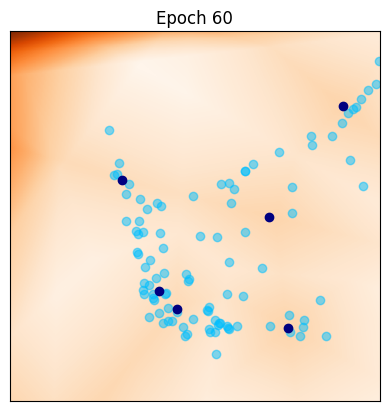

[61/100] 	Loss_D: -0.0705	Loss_G: -20.1895	Lip(D)=1.0484
[62/100] 	Loss_D: -0.0763	Loss_G: -20.9906	Lip(D)=1.0219
[63/100] 	Loss_D: -0.0877	Loss_G: -21.5182	Lip(D)=1.0444
[64/100] 	Loss_D: -0.0832	Loss_G: -22.2578	Lip(D)=1.0830
[65/100] 	Loss_D: -0.0454	Loss_G: -21.9625	Lip(D)=0.9523


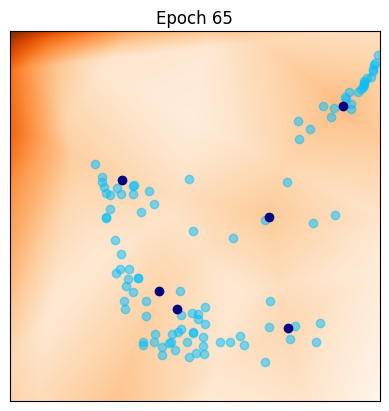

[66/100] 	Loss_D: -0.0682	Loss_G: -23.7436	Lip(D)=1.0247
[67/100] 	Loss_D: -0.0586	Loss_G: -24.6770	Lip(D)=1.0023
[68/100] 	Loss_D: -0.0737	Loss_G: -25.4466	Lip(D)=1.0304
[69/100] 	Loss_D: -0.0870	Loss_G: -26.5533	Lip(D)=1.0824
[70/100] 	Loss_D: -0.0823	Loss_G: -26.8607	Lip(D)=1.0417


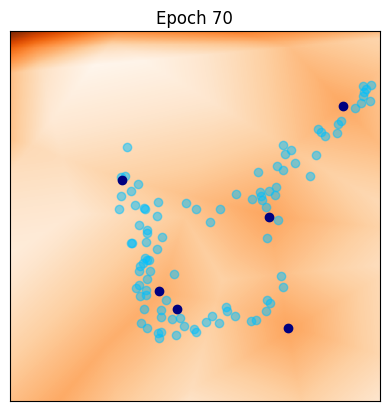

[71/100] 	Loss_D: -0.0899	Loss_G: -26.5374	Lip(D)=1.0287
[72/100] 	Loss_D: -0.0773	Loss_G: -26.5449	Lip(D)=1.0597
[73/100] 	Loss_D: -0.0769	Loss_G: -27.0447	Lip(D)=1.0170
[74/100] 	Loss_D: -0.0689	Loss_G: -27.5579	Lip(D)=1.0458
[75/100] 	Loss_D: -0.0697	Loss_G: -27.9601	Lip(D)=1.0183


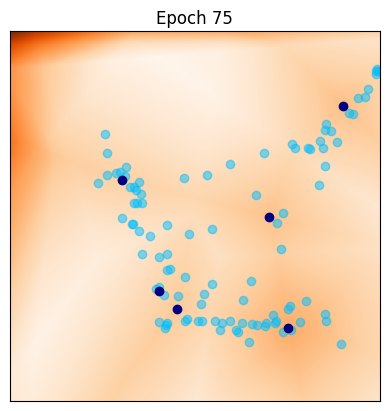

[76/100] 	Loss_D: -0.0680	Loss_G: -27.9167	Lip(D)=1.0662
[77/100] 	Loss_D: -0.0678	Loss_G: -28.0041	Lip(D)=1.0466
[78/100] 	Loss_D: -0.0748	Loss_G: -28.1263	Lip(D)=1.0265
[79/100] 	Loss_D: -0.0654	Loss_G: -29.1150	Lip(D)=1.0220
[80/100] 	Loss_D: -0.0680	Loss_G: -29.2353	Lip(D)=1.0252


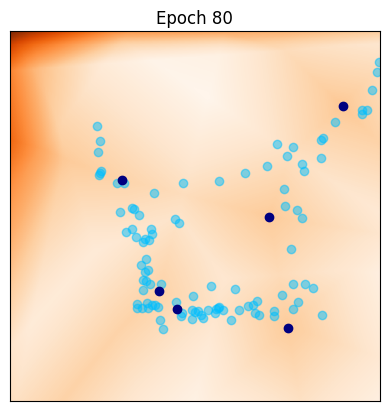

[81/100] 	Loss_D: -0.0727	Loss_G: -29.8119	Lip(D)=1.0380
[82/100] 	Loss_D: -0.0742	Loss_G: -30.8077	Lip(D)=1.0628
[83/100] 	Loss_D: -0.0795	Loss_G: -30.5787	Lip(D)=1.0462
[84/100] 	Loss_D: -0.0836	Loss_G: -30.6707	Lip(D)=1.0308
[85/100] 	Loss_D: -0.0808	Loss_G: -31.1350	Lip(D)=1.0214


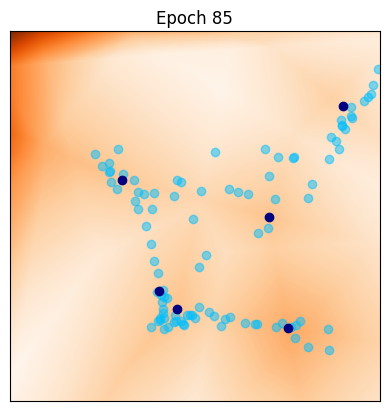

[86/100] 	Loss_D: -0.0697	Loss_G: -30.0765	Lip(D)=1.0278
[87/100] 	Loss_D: -0.0692	Loss_G: -32.7613	Lip(D)=1.0150
[88/100] 	Loss_D: -0.0778	Loss_G: -31.7306	Lip(D)=1.0471
[89/100] 	Loss_D: -0.0734	Loss_G: -31.0985	Lip(D)=1.0807
[90/100] 	Loss_D: -0.0704	Loss_G: -34.0689	Lip(D)=1.0382


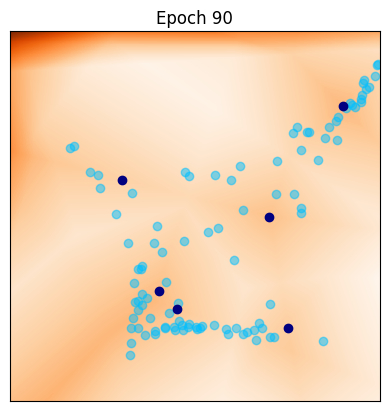

[91/100] 	Loss_D: -0.0765	Loss_G: -34.5063	Lip(D)=1.0296
[92/100] 	Loss_D: -0.0852	Loss_G: -33.5777	Lip(D)=1.0439
[93/100] 	Loss_D: -0.0817	Loss_G: -35.4891	Lip(D)=1.0235
[94/100] 	Loss_D: -0.0838	Loss_G: -34.3088	Lip(D)=1.0679
[95/100] 	Loss_D: -0.0768	Loss_G: -35.0420	Lip(D)=1.0019


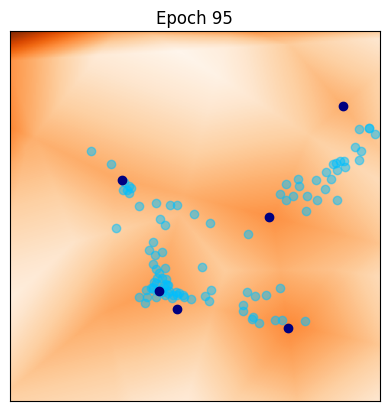

[96/100] 	Loss_D: -0.0928	Loss_G: -35.7124	Lip(D)=1.0134
[97/100] 	Loss_D: -0.0835	Loss_G: -36.0514	Lip(D)=1.1045
[98/100] 	Loss_D: -0.0705	Loss_G: -33.9640	Lip(D)=1.0162
[99/100] 	Loss_D: -0.0761	Loss_G: -34.8388	Lip(D)=1.0317


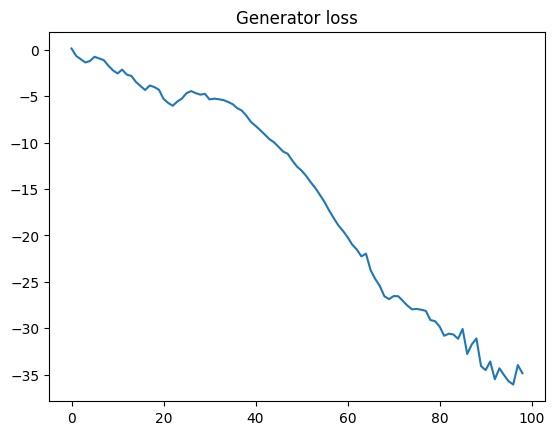

<All keys matched successfully>

In [25]:
## parameters for training
n_epochs = 100
niterD=1000
niterG=20
gpw = 1

lr = 0.001      # learning rate for generator
lrdisc = 0.002  # learning rate for discriminator
beta_1 = 0.5
beta_2 = 0.999


torch.manual_seed(1)  # initialize random seed for reproducibility

# Initialize generators and discriminators
G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
optimG = optim.Adam(G.parameters(), lr=lr)

D = Discriminator(n_in=d, n_hid=10).to(device)
optimD = optim.Adam(D.parameters(), lr=lrdisc, betas=(beta_1, beta_2))


Glosses = []
Dlosses = []

iter_display = 5

# Main loop
for epoch in range(1,n_epochs):

    ############################
    ### Train discriminator (niterD iterations)
    ############################

    for iter in range(0,niterD):
        optimD.zero_grad()

        z = torch.randn((b, n_in), device=device)
        x = G(z)
        gp = gradient_penalty(D, x.detach(), y)
        Dloss = -torch.mean(D(y)) + torch.mean(D(x.detach())) + gpw * gp

        Dloss.backward()
        optimD.step()

    ############################
    ### Train generator (niterG iterations)
    ############################
    for iter in range(0,niterG):
        optimG.zero_grad()

        z = torch.randn((b, n_in), device=device)
        x = G(z)
        Gloss = -torch.mean(D(x))

        Gloss.backward()
        optimG.step()

    # Output training stats
    print('[%d/%d] \tLoss_D: %.4f\tLoss_G: %.4f\tLip(D)=%.4f'
      % (epoch, n_epochs, Dloss.item(), Gloss.item(),lipconstant(D,x,y).item()))
    Glosses.append(Gloss.item())
    Dlosses.append(Dloss.item())

    if(epoch % iter_display == 0):
        Dxgrid = D(xgrid).detach().cpu().numpy().reshape(nr,nc)
        z = torch.randn(b, n_in, device=device)
        x = G(z)
        xd = x.detach().squeeze(1)
        strtitle = 'Epoch '+str(epoch)
        fig = plt.figure(dpi=100)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(Dxgrid,cmap = 'Oranges', extent=extent)
        plt.scatter(xd[:, 0].cpu(), xd[:,1].cpu(),c='deepskyblue',alpha=.5)
        plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
        plt.title(strtitle)
        plt.show()


plt.figure(dpi=100)
plt.plot(Glosses)
plt.title('Generator loss')
plt.show()

# Save final generator for later use
wgan = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
wgan.load_state_dict(G.state_dict())

## Train the generator only

QUESTION: For a fixed discriminator, optimize only the generator only. Can you explain what is happening then?

**Answer :**

The generator gradually improves its ability to produce data that the fixed discriminator is more likely to classify as real. however since the discriminator is fixed, the evaluation standard for the generator remains constant and so the generator overfits to the discriminator

[1/100] 	Loss_D: -0.0767	Loss_G: 0.6455	Lip(D)=0.2521
[2/100] 	Loss_D: -0.0767	Loss_G: 0.6257	Lip(D)=0.2521
[3/100] 	Loss_D: -0.0767	Loss_G: 0.6053	Lip(D)=0.2555
[4/100] 	Loss_D: -0.0767	Loss_G: 0.5811	Lip(D)=0.2538
[5/100] 	Loss_D: -0.0767	Loss_G: 0.5572	Lip(D)=0.2538


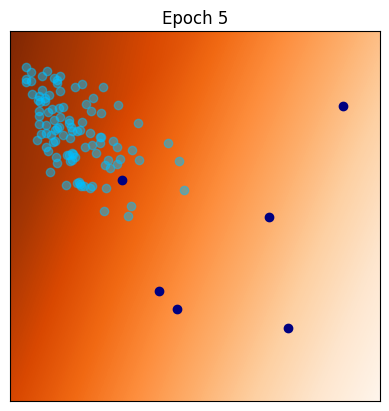

[6/100] 	Loss_D: -0.0767	Loss_G: 0.5401	Lip(D)=0.2332
[7/100] 	Loss_D: -0.0767	Loss_G: 0.5327	Lip(D)=0.2427
[8/100] 	Loss_D: -0.0767	Loss_G: 0.5278	Lip(D)=0.2332
[9/100] 	Loss_D: -0.0767	Loss_G: 0.5200	Lip(D)=0.2444
[10/100] 	Loss_D: -0.0767	Loss_G: 0.5175	Lip(D)=0.2315


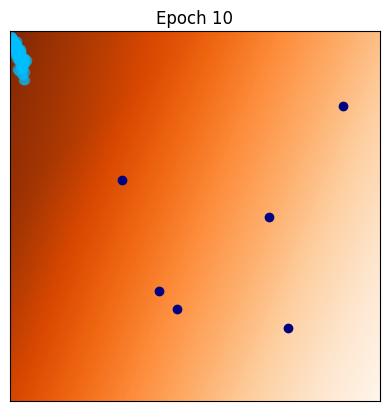

[11/100] 	Loss_D: -0.0767	Loss_G: 0.5147	Lip(D)=0.2332
[12/100] 	Loss_D: -0.0767	Loss_G: 0.5132	Lip(D)=0.2381
[13/100] 	Loss_D: -0.0767	Loss_G: 0.5119	Lip(D)=0.2409
[14/100] 	Loss_D: -0.0767	Loss_G: 0.5111	Lip(D)=0.2203
[15/100] 	Loss_D: -0.0767	Loss_G: 0.5111	Lip(D)=0.2408


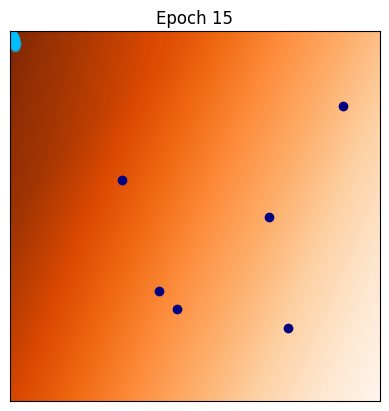

[16/100] 	Loss_D: -0.0767	Loss_G: 0.5104	Lip(D)=0.2186
[17/100] 	Loss_D: -0.0767	Loss_G: 0.5100	Lip(D)=0.2202
[18/100] 	Loss_D: -0.0767	Loss_G: 0.5099	Lip(D)=0.2484
[19/100] 	Loss_D: -0.0767	Loss_G: 0.5097	Lip(D)=0.2200
[20/100] 	Loss_D: -0.0767	Loss_G: 0.5097	Lip(D)=0.2389


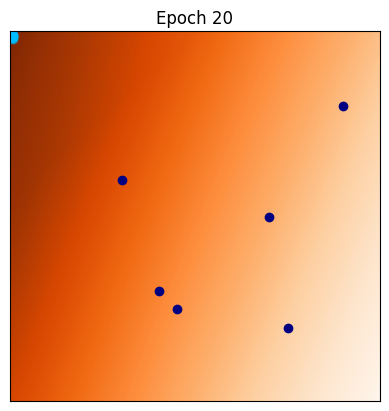

[21/100] 	Loss_D: -0.0767	Loss_G: 0.5095	Lip(D)=0.1997
[22/100] 	Loss_D: -0.0767	Loss_G: 0.5094	Lip(D)=0.2315
[23/100] 	Loss_D: -0.0767	Loss_G: 0.5093	Lip(D)=0.2347
[24/100] 	Loss_D: -0.0767	Loss_G: 0.5091	Lip(D)=0.2203
[25/100] 	Loss_D: -0.0767	Loss_G: 0.5092	Lip(D)=0.2277


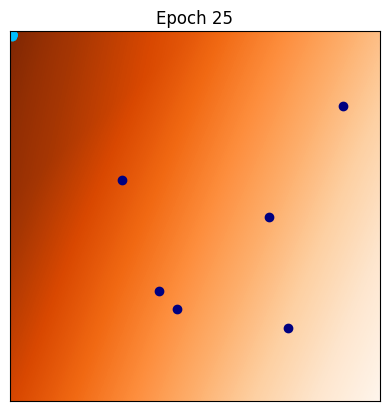

[26/100] 	Loss_D: -0.0767	Loss_G: 0.5090	Lip(D)=0.2220
[27/100] 	Loss_D: -0.0767	Loss_G: 0.5091	Lip(D)=0.2332
[28/100] 	Loss_D: -0.0767	Loss_G: 0.5090	Lip(D)=0.2366
[29/100] 	Loss_D: -0.0767	Loss_G: 0.5089	Lip(D)=0.2280
[30/100] 	Loss_D: -0.0767	Loss_G: 0.5089	Lip(D)=0.2332


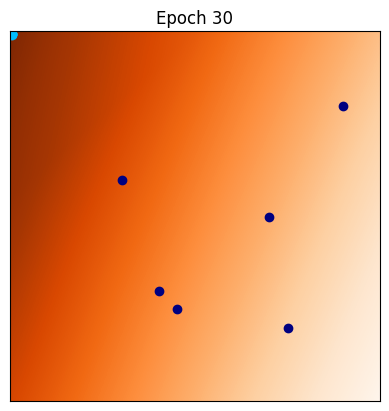

[31/100] 	Loss_D: -0.0767	Loss_G: 0.5089	Lip(D)=0.2315
[32/100] 	Loss_D: -0.0767	Loss_G: 0.5089	Lip(D)=0.2538
[33/100] 	Loss_D: -0.0767	Loss_G: 0.5089	Lip(D)=0.2298
[34/100] 	Loss_D: -0.0767	Loss_G: 0.5088	Lip(D)=0.2426
[35/100] 	Loss_D: -0.0767	Loss_G: 0.5088	Lip(D)=0.2298


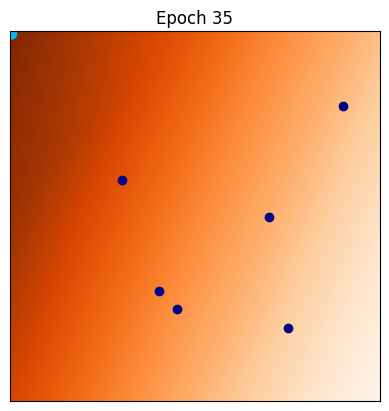

[36/100] 	Loss_D: -0.0767	Loss_G: 0.5088	Lip(D)=0.2315
[37/100] 	Loss_D: -0.0767	Loss_G: 0.5088	Lip(D)=0.2185
[38/100] 	Loss_D: -0.0767	Loss_G: 0.5088	Lip(D)=0.2521
[39/100] 	Loss_D: -0.0767	Loss_G: 0.5088	Lip(D)=0.2295
[40/100] 	Loss_D: -0.0767	Loss_G: 0.5087	Lip(D)=0.2165


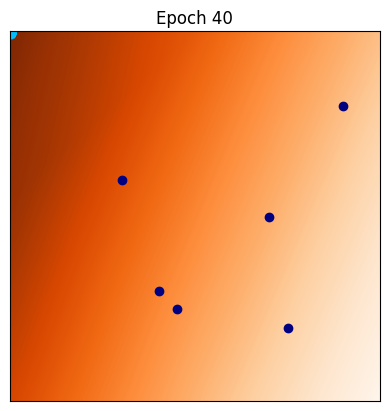

[41/100] 	Loss_D: -0.0767	Loss_G: 0.5087	Lip(D)=0.2312
[42/100] 	Loss_D: -0.0767	Loss_G: 0.5087	Lip(D)=0.2405
[43/100] 	Loss_D: -0.0767	Loss_G: 0.5087	Lip(D)=0.2406
[44/100] 	Loss_D: -0.0767	Loss_G: 0.5087	Lip(D)=0.2332
[45/100] 	Loss_D: -0.0767	Loss_G: 0.5087	Lip(D)=0.2373


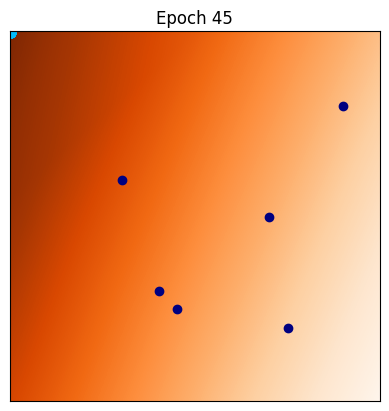

[46/100] 	Loss_D: -0.0767	Loss_G: 0.5087	Lip(D)=0.2388
[47/100] 	Loss_D: -0.0767	Loss_G: 0.5087	Lip(D)=0.2389
[48/100] 	Loss_D: -0.0767	Loss_G: 0.5087	Lip(D)=0.2404
[49/100] 	Loss_D: -0.0767	Loss_G: 0.5087	Lip(D)=0.2444
[50/100] 	Loss_D: -0.0767	Loss_G: 0.5087	Lip(D)=0.2315


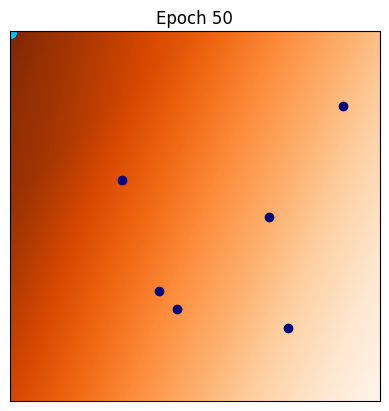

[51/100] 	Loss_D: -0.0767	Loss_G: 0.5087	Lip(D)=0.2408
[52/100] 	Loss_D: -0.0767	Loss_G: 0.5087	Lip(D)=0.2500
[53/100] 	Loss_D: -0.0767	Loss_G: 0.5087	Lip(D)=0.2183
[54/100] 	Loss_D: -0.0767	Loss_G: 0.5087	Lip(D)=0.2520
[55/100] 	Loss_D: -0.0767	Loss_G: 0.5087	Lip(D)=0.2517


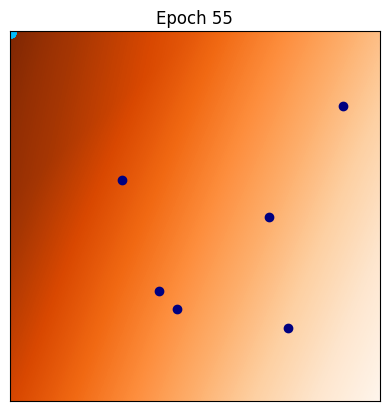

[56/100] 	Loss_D: -0.0767	Loss_G: 0.5087	Lip(D)=0.2520
[57/100] 	Loss_D: -0.0767	Loss_G: 0.5087	Lip(D)=0.2403
[58/100] 	Loss_D: -0.0767	Loss_G: 0.5087	Lip(D)=0.2481
[59/100] 	Loss_D: -0.0767	Loss_G: 0.5087	Lip(D)=0.2220
[60/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2314


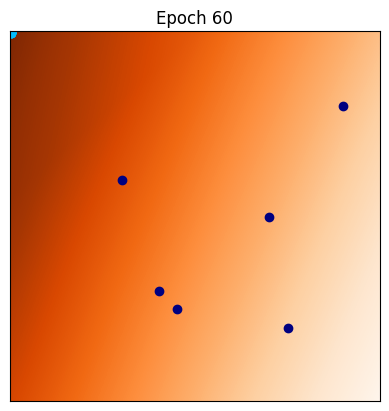

[61/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2314
[62/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2370
[63/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2312
[64/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2203
[65/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2444


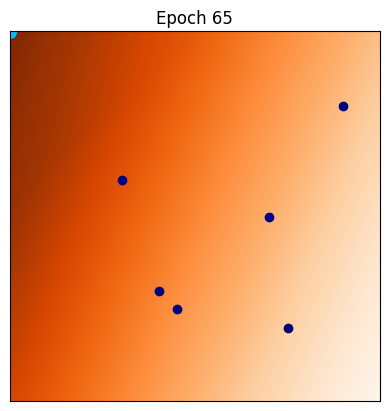

[66/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2290
[67/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2409
[68/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2310
[69/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2232
[70/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2381


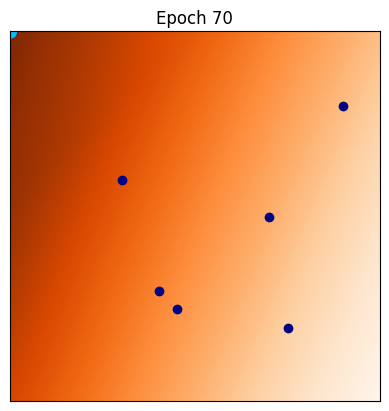

[71/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2426
[72/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2295
[73/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2406
[74/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2278
[75/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2294


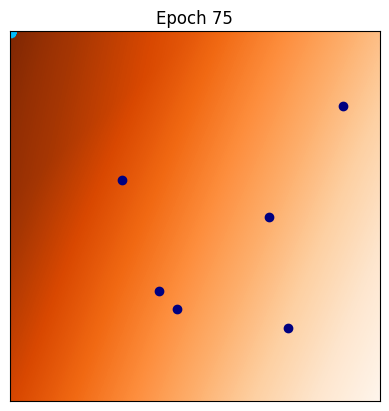

[76/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2389
[77/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2314
[78/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2312
[79/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2315
[80/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2409


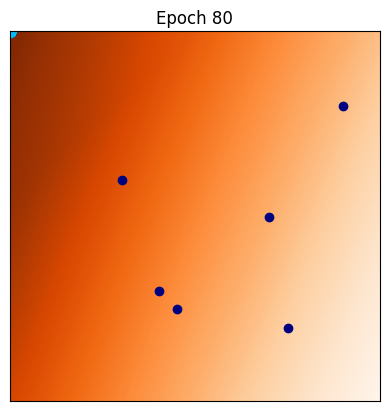

[81/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2365
[82/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2091
[83/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2296
[84/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2295
[85/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2071


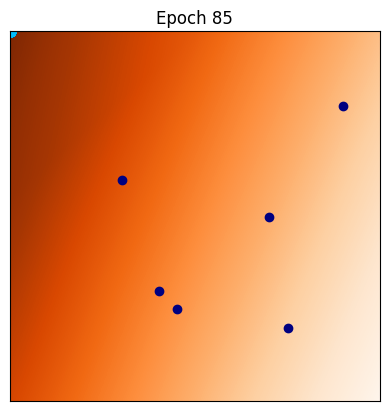

[86/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2091
[87/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2444
[88/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2388
[89/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2279
[90/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2109


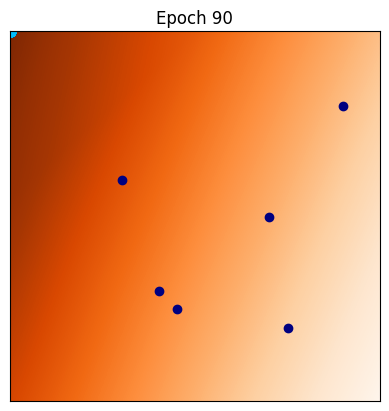

[91/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2332
[92/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2220
[93/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2427
[94/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2502
[95/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2314


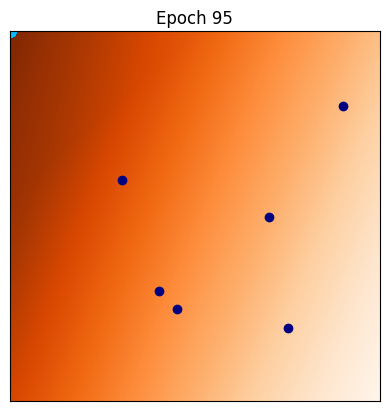

[96/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2297
[97/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2332
[98/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2220
[99/100] 	Loss_D: -0.0767	Loss_G: 0.5086	Lip(D)=0.2538


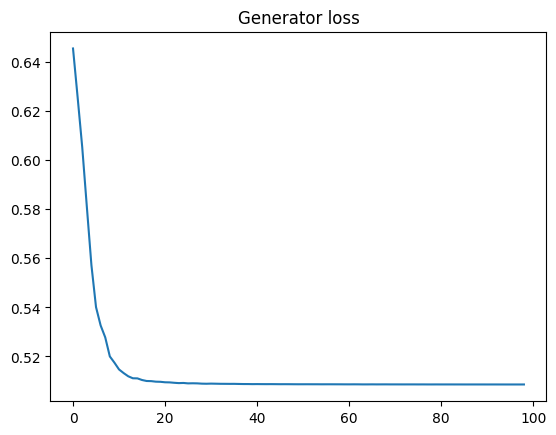

<All keys matched successfully>

In [20]:
## parameters for training
n_epochs = 100
niterD=1000
niterG=10
gpw = .1

lr = 0.002      # learning rate for generator
beta_1 = 0.5
beta_2 = 0.999

torch.manual_seed(1)  # initialize random seed for reproducibility

# Initialize generators and discriminators
G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
optimG = optim.Adam(G.parameters(), lr=lr)

D = Discriminator(n_in=d, n_hid=10).to(device)
optimD = optim.Adam(D.parameters(), lr=lrdisc, betas=(beta_1, beta_2))


Glosses = []
Dlosses = []

iter_display = 5

# Main loop
for epoch in range(1,n_epochs):

    ############################
    ### Train generator (niterG iterations)
    ############################
    for iter in range(0,niterG):
        optimG.zero_grad()

        z = torch.randn((b, n_in), device=device)
        x = G(z)
        Gloss = -torch.mean(D(x))

        Gloss.backward()
        optimG.step()

    # Output training stats
    print('[%d/%d] \tLoss_D: %.4f\tLoss_G: %.4f\tLip(D)=%.4f'
      % (epoch, n_epochs, Dloss.item(), Gloss.item(),lipconstant(D,x,y).item()))
    Glosses.append(Gloss.item())
    Dlosses.append(Dloss.item())

    if(epoch % iter_display == 0):
        Dxgrid = D(xgrid).detach().cpu().numpy().reshape(nr,nc)
        z = torch.randn(b, n_in, device=device)
        x = G(z)
        xd = x.detach().squeeze(1)
        strtitle = 'Epoch '+str(epoch)
        fig = plt.figure(dpi=100)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(Dxgrid,cmap = 'Oranges', extent=extent)
        plt.scatter(xd[:, 0].cpu(), xd[:,1].cpu(),c='deepskyblue',alpha=.5)
        plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
        plt.title(strtitle)
        plt.show()


plt.figure(dpi=100)
plt.plot(Glosses)
plt.title('Generator loss')
plt.show()

# Save final generator for later use
wgan = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
wgan.load_state_dict(G.state_dict())

<br/><br/><br/><br/>

# BONUS Exercise (to do at home) : Learn a standard GAN

## Define Loss for GAN training

For stable GAN training uses the Binary cross-entropy loss which takes labeled data as input.

The data points $y$ should correspond to values $\approx 1$, whereas fake points $x$ should get values $\approx 0$.

We also introduce the sigmoid function. for displaying purpose: for GAN training, the discriminator values in $[0,1]$ will be obtained by applying after $D$.

In [21]:
criterion = nn.BCEWithLogitsLoss()
V1 = torch.full((n,1), 1. , dtype=torch.float, device=device)
V0 = torch.full((b,1), 0. , dtype=torch.float, device=device)

sig = nn.Sigmoid()

## Train the discriminator for a fixed generator

QUESTION: Complete the following code at the blocks ###...###

[0/1000], 1.503940


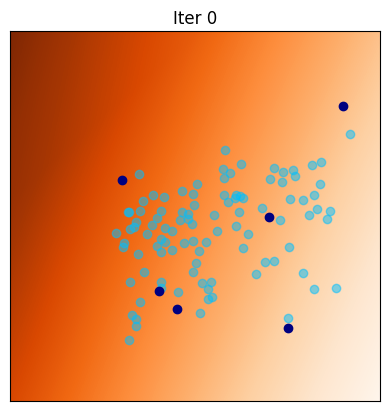

[100/1000], 1.380111


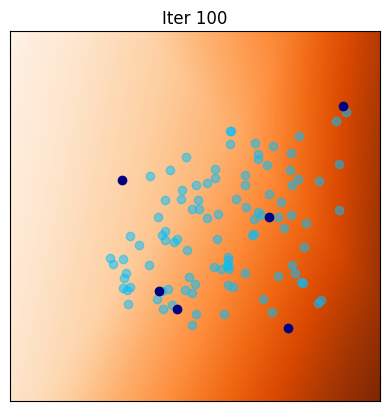

[200/1000], 1.357804


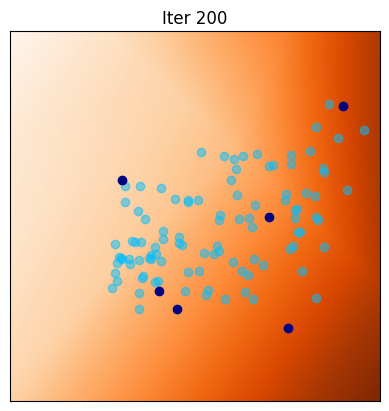

[300/1000], 1.294269


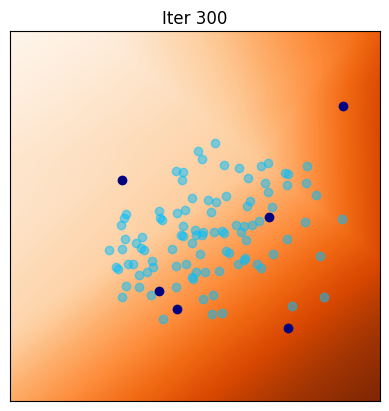

[400/1000], 1.232520


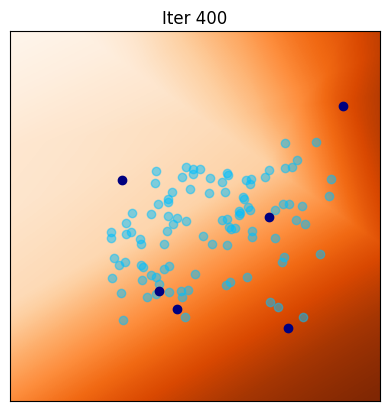

[500/1000], 1.252911


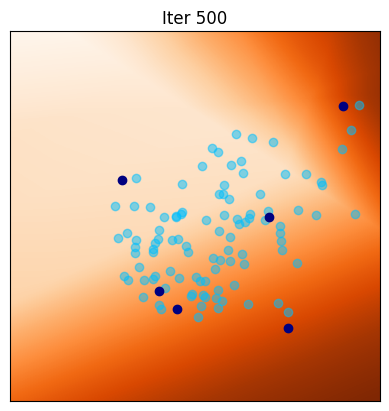

[600/1000], 1.167742


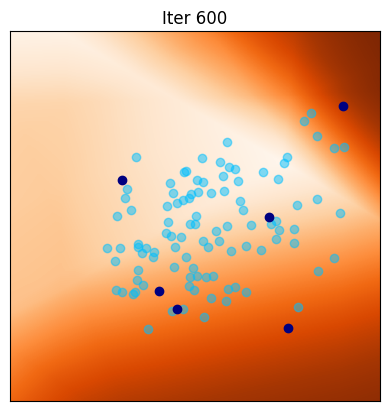

[700/1000], 1.067776


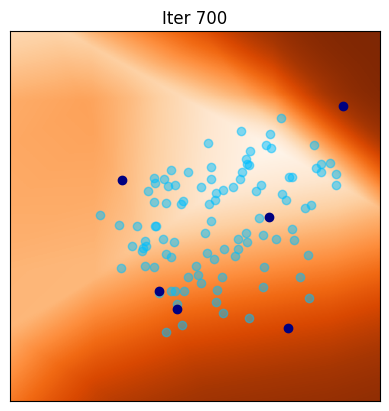

[800/1000], 1.003313


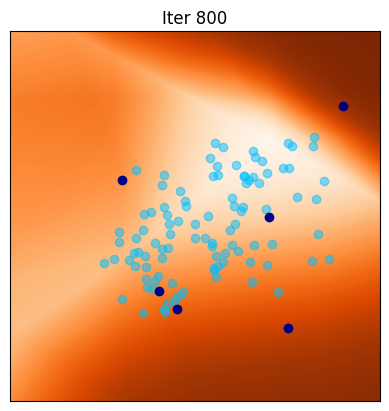

[900/1000], 0.977313


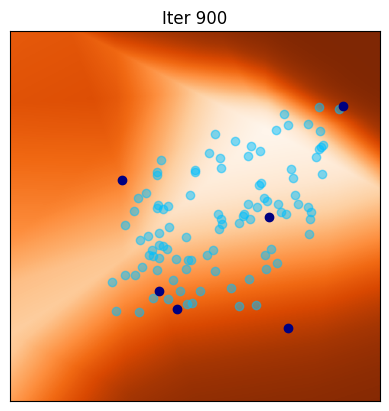

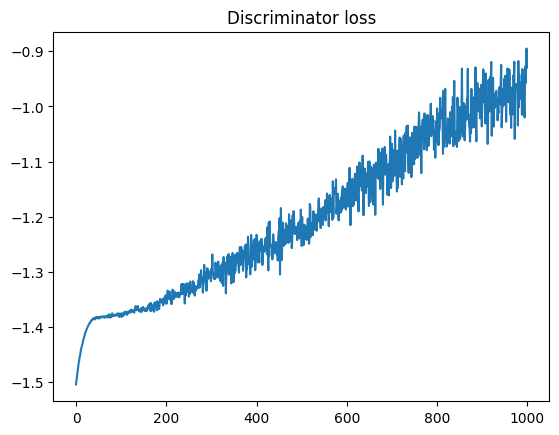

In [22]:
torch.manual_seed(1)  # initialize random seed for reproducibility

# parameters for discriminator optimization
lrdisc = 0.002
beta_1 = 0.5
beta_2 = 0.999
niterD=1000

# Initialize generators and discriminators
G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
optimG = optim.Adam(G.parameters(), lr=lr)

D = Discriminator(n_in=d, n_hid=10).to(device)
optimD = optim.Adam(D.parameters(), lr=lrdisc, betas=(beta_1, 0.999))

iter_display = 100  # display current configuration each iter_display iteration

Dlosses = []

for iter in range(0,niterD):

    optimD.zero_grad()

    z = torch.randn((b, n_in), device=device)
    x = G(z)

    D_real = D(y)
    D_fake = D(x.detach())

    loss_real = criterion(D_real, V1)
    loss_fake = criterion(D_fake, V0)

    Dloss = loss_real + loss_fake

    Dloss.backward()
    optimD.step()

    ### SAVE LOSS ###
    Dlosst = Dloss.item()
    Dlosses.append(-Dlosst)

    if(iter%iter_display == 0):
        print('[%d/%d], %f' % (iter, niterD, Dlosst))
        Dxgrid = sig(D(xgrid)).detach().cpu().numpy().reshape(nr,nc)
        x = G(z)
        xd = x.detach().squeeze(1)
        strtitle = 'Iter '+str(iter)
        fig = plt.figure(dpi=100)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(Dxgrid,cmap = 'Oranges', extent=extent)  # discriminator
        plt.scatter(xd[:, 0].cpu(), xd[:,1].cpu(),c='deepskyblue',alpha=.5)
        plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
        plt.title(strtitle)
        plt.show()


### Plot the evolution of the discriminator loss ###
plt.figure(dpi=100)
plt.plot(Dlosses)
plt.title('Discriminator loss')
plt.show()

## Train both the Generator and Discriminator

[0/100] 	Loss_D: 1.3780	Loss_G: 0.6984


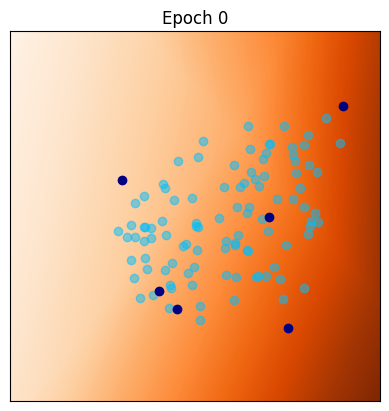

[1/100] 	Loss_D: 1.3494	Loss_G: 0.6717
[2/100] 	Loss_D: 1.2237	Loss_G: 0.6538
[3/100] 	Loss_D: 1.2003	Loss_G: 0.5162
[4/100] 	Loss_D: 1.1502	Loss_G: 0.4914
[5/100] 	Loss_D: 0.9884	Loss_G: 0.4390
[6/100] 	Loss_D: 0.9545	Loss_G: 0.3608
[7/100] 	Loss_D: 0.7414	Loss_G: 0.3999
[8/100] 	Loss_D: 0.6322	Loss_G: 0.4321
[9/100] 	Loss_D: 0.5753	Loss_G: 0.2738
[10/100] 	Loss_D: 0.4023	Loss_G: 0.2183


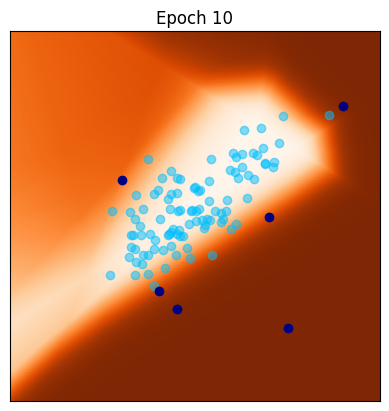

[11/100] 	Loss_D: 0.3664	Loss_G: 0.1788
[12/100] 	Loss_D: 0.2426	Loss_G: 0.1053
[13/100] 	Loss_D: 0.1440	Loss_G: 0.2452
[14/100] 	Loss_D: 0.1466	Loss_G: 0.0635
[15/100] 	Loss_D: 0.0829	Loss_G: 0.0772
[16/100] 	Loss_D: 0.0679	Loss_G: 0.0399
[17/100] 	Loss_D: 0.0678	Loss_G: 0.0244
[18/100] 	Loss_D: 0.0415	Loss_G: 0.0404
[19/100] 	Loss_D: 0.0326	Loss_G: 0.0113
[20/100] 	Loss_D: 0.0385	Loss_G: 0.0332


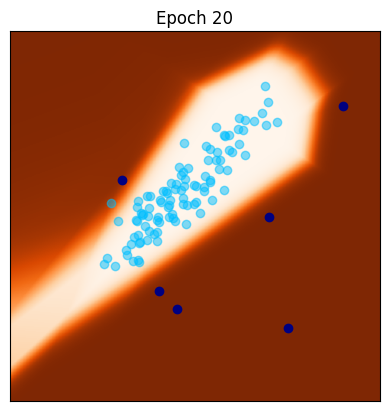

[21/100] 	Loss_D: 0.0233	Loss_G: 0.0122
[22/100] 	Loss_D: 0.0211	Loss_G: 0.0176
[23/100] 	Loss_D: 0.0186	Loss_G: 0.0032
[24/100] 	Loss_D: 0.0269	Loss_G: 0.0064
[25/100] 	Loss_D: 0.0148	Loss_G: 0.0169
[26/100] 	Loss_D: 0.0175	Loss_G: 0.0015
[27/100] 	Loss_D: 0.0113	Loss_G: 0.0041
[28/100] 	Loss_D: 0.0063	Loss_G: 0.0025
[29/100] 	Loss_D: 0.0072	Loss_G: 0.0096
[30/100] 	Loss_D: 0.0051	Loss_G: 0.0041


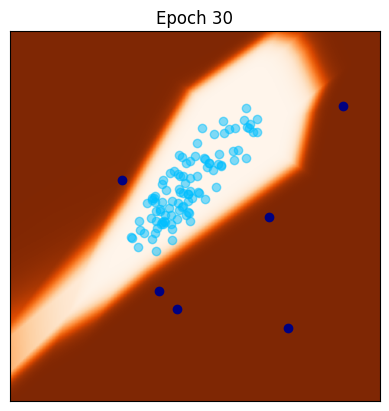

[31/100] 	Loss_D: 0.0042	Loss_G: 0.0027
[32/100] 	Loss_D: 0.0042	Loss_G: 0.0166
[33/100] 	Loss_D: 0.0041	Loss_G: 0.0057
[34/100] 	Loss_D: 0.0037	Loss_G: 0.0044
[35/100] 	Loss_D: 0.0040	Loss_G: 0.0007
[36/100] 	Loss_D: 0.0024	Loss_G: 0.0004
[37/100] 	Loss_D: 0.0031	Loss_G: 0.0004
[38/100] 	Loss_D: 0.0015	Loss_G: 0.0004
[39/100] 	Loss_D: 0.0015	Loss_G: 0.0007
[40/100] 	Loss_D: 0.0022	Loss_G: 0.0013


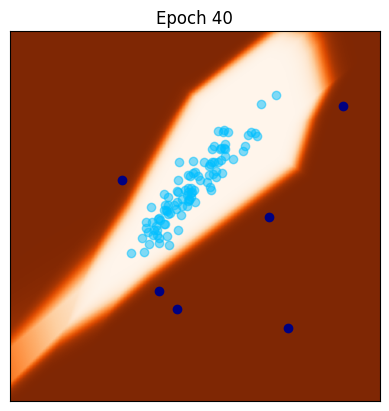

[41/100] 	Loss_D: 0.0016	Loss_G: 0.0006
[42/100] 	Loss_D: 0.0014	Loss_G: 0.0002
[43/100] 	Loss_D: 0.0008	Loss_G: 0.0002
[44/100] 	Loss_D: 0.0010	Loss_G: 0.0003
[45/100] 	Loss_D: 0.0012	Loss_G: 0.0002
[46/100] 	Loss_D: 0.0007	Loss_G: 0.0002
[47/100] 	Loss_D: 0.0006	Loss_G: 0.0002
[48/100] 	Loss_D: 0.0007	Loss_G: 0.0006
[49/100] 	Loss_D: 0.0006	Loss_G: 0.0003
[50/100] 	Loss_D: 0.0013	Loss_G: 0.0001


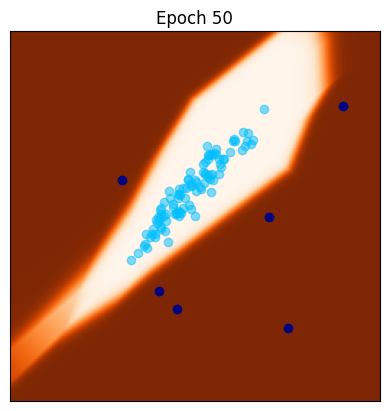

[51/100] 	Loss_D: 0.0008	Loss_G: 0.0001
[52/100] 	Loss_D: 0.0004	Loss_G: 0.0004
[53/100] 	Loss_D: 0.0003	Loss_G: 0.0002
[54/100] 	Loss_D: 0.0003	Loss_G: 0.0001
[55/100] 	Loss_D: 0.0003	Loss_G: 0.0001
[56/100] 	Loss_D: 0.0003	Loss_G: 0.0000
[57/100] 	Loss_D: 0.0004	Loss_G: 0.0002
[58/100] 	Loss_D: 0.0002	Loss_G: 0.0000
[59/100] 	Loss_D: 0.0003	Loss_G: 0.0001
[60/100] 	Loss_D: 0.0002	Loss_G: 0.0001


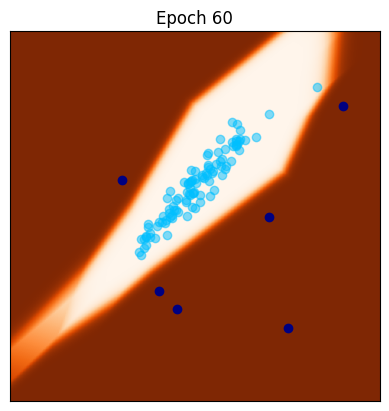

[61/100] 	Loss_D: 0.0002	Loss_G: 0.0002
[62/100] 	Loss_D: 0.0003	Loss_G: 0.0001
[63/100] 	Loss_D: 0.0001	Loss_G: 0.0000
[64/100] 	Loss_D: 0.0003	Loss_G: 0.0000
[65/100] 	Loss_D: 0.0004	Loss_G: 0.0000
[66/100] 	Loss_D: 0.0003	Loss_G: 0.0000
[67/100] 	Loss_D: 0.0007	Loss_G: 0.0000
[68/100] 	Loss_D: 0.0001	Loss_G: 0.0000
[69/100] 	Loss_D: 0.0001	Loss_G: 0.0000
[70/100] 	Loss_D: 0.0003	Loss_G: 0.0000


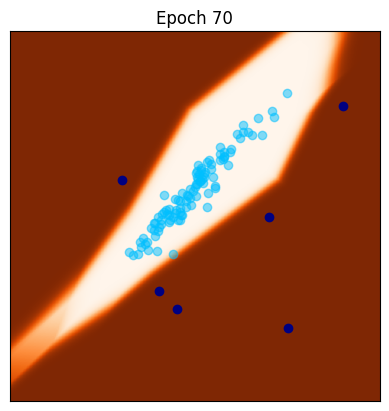

[71/100] 	Loss_D: 0.0001	Loss_G: 0.0000
[72/100] 	Loss_D: 0.0001	Loss_G: 0.0000
[73/100] 	Loss_D: 0.0001	Loss_G: 0.0000
[74/100] 	Loss_D: 0.0001	Loss_G: 0.0000
[75/100] 	Loss_D: 0.0002	Loss_G: 0.0000
[76/100] 	Loss_D: 0.0001	Loss_G: 0.0000
[77/100] 	Loss_D: 0.0005	Loss_G: 0.0001
[78/100] 	Loss_D: 0.0001	Loss_G: 0.0000
[79/100] 	Loss_D: 0.0001	Loss_G: 0.0000
[80/100] 	Loss_D: 0.0001	Loss_G: 0.0002


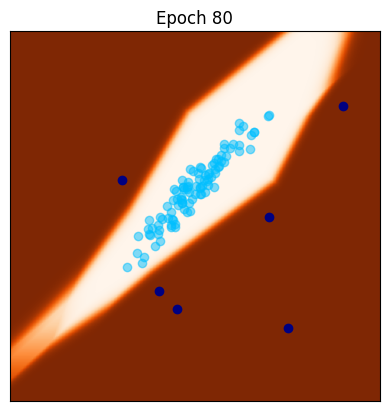

[81/100] 	Loss_D: 0.0001	Loss_G: 0.0000
[82/100] 	Loss_D: 0.0002	Loss_G: 0.0000
[83/100] 	Loss_D: 0.0000	Loss_G: 0.0001
[84/100] 	Loss_D: 0.0001	Loss_G: 0.0000
[85/100] 	Loss_D: 0.0001	Loss_G: 0.0000
[86/100] 	Loss_D: 0.0001	Loss_G: 0.0000
[87/100] 	Loss_D: 0.0001	Loss_G: 0.0000
[88/100] 	Loss_D: 0.0001	Loss_G: 0.0000
[89/100] 	Loss_D: 0.0001	Loss_G: 0.0000
[90/100] 	Loss_D: 0.0001	Loss_G: 0.0000


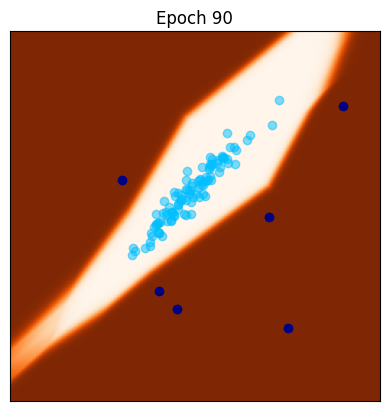

[91/100] 	Loss_D: 0.0000	Loss_G: 0.0000
[92/100] 	Loss_D: 0.0000	Loss_G: 0.0000
[93/100] 	Loss_D: 0.0001	Loss_G: 0.0000
[94/100] 	Loss_D: 0.0001	Loss_G: 0.0000
[95/100] 	Loss_D: 0.0000	Loss_G: 0.0000
[96/100] 	Loss_D: 0.0001	Loss_G: 0.0000
[97/100] 	Loss_D: 0.0001	Loss_G: 0.0000
[98/100] 	Loss_D: 0.0000	Loss_G: 0.0000
[99/100] 	Loss_D: 0.0000	Loss_G: 0.0000


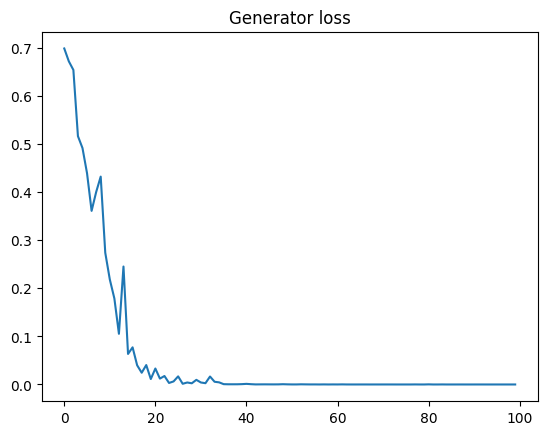

In [29]:
lr = 0.002   # learning rate for generator
lrdisc = 0.002   # learning rate for generator

## parameters for training
n_epochs = 100
niterD=100
niterG=1

torch.manual_seed(1)  # initialize random seed for reproducibility

# Initialize generators and discriminators
G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
optimG = optim.Adam(G.parameters(), lr=lr)

D = Discriminator(n_in=d, n_hid=10).to(device)
optimD = optim.Adam(D.parameters(), lr=lrdisc, betas=(beta_1, beta_2))

Glosses = []
Dlosses = []

iter_display = 10

# Main loop
for epoch in range(n_epochs):

    ############################
    ### Train discriminator (niterD iterations)
    ############################
    for iter in range(0,niterD):
        optimD.zero_grad()

        z = torch.randn((b, n_in), device=device)
        x = G(z)

        D_real = D(y)
        D_fake = D(x.detach())

        loss_real = criterion(D_real, V1)
        loss_fake = criterion(D_fake, V0)

        Dloss = loss_real + loss_fake

        Dloss.backward()
        optimD.step()

    ############################
    ### Train generator (niterG iterations)
    ############################
    for iter in range(0,niterG):
        optimG.zero_grad()

        z = torch.randn((b, n_in), device=device)
        x = G(z)
        D_fake = D(x)

        Gloss = criterion(D_fake, V0)

        Gloss.backward()
        optimG.step()


    # Output training stats
    print('[%d/%d] \tLoss_D: %.4f\tLoss_G: %.4f'
      % (epoch, n_epochs, Dloss.item(), Gloss.item()))
    Glosses.append(Gloss.item())
    Dlosses.append(-Dloss.item())


    if(epoch % iter_display == 0):
        Dxgrid = sig(D(xgrid)).detach().cpu().numpy().reshape(nr,nc)
        z = torch.randn(b, 1, n_in, device=device)
        x = G(z)
        xd = x.detach().squeeze(1)
        strtitle = 'Epoch '+str(epoch)
        fig = plt.figure(dpi=100)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(Dxgrid,cmap = 'Oranges', extent=extent)  # discriminator
        plt.scatter(xd[:, 0].cpu(), xd[:,1].cpu(),c='deepskyblue',alpha=.5)
        plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
        plt.title(strtitle)
        plt.show()

# Save final generator for later use
gan = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
gan.load_state_dict(G.state_dict())

### Plot the evolution of the discriminator loss ###
plt.figure(dpi=100)
plt.plot(Glosses)
plt.title('Generator loss')
plt.show()